## Pair Trading Study in Taiwan market

Pair trading has quite a well-known strategy that work on the concept of statistical arbitrage that takes advantage of mean reversion or convergence in the prices of two instruments. In order for the strategy to work, the spread between the two instruments should be fairly stationary. In addition, we will try to find mutiples pairs and fine tune this strategy by incorporating Martingale strategy when initiation,integrate stoploss and also explore the usage of kalman filter

#### Flow of this workbook

In [4]:
from IPython.display import Image

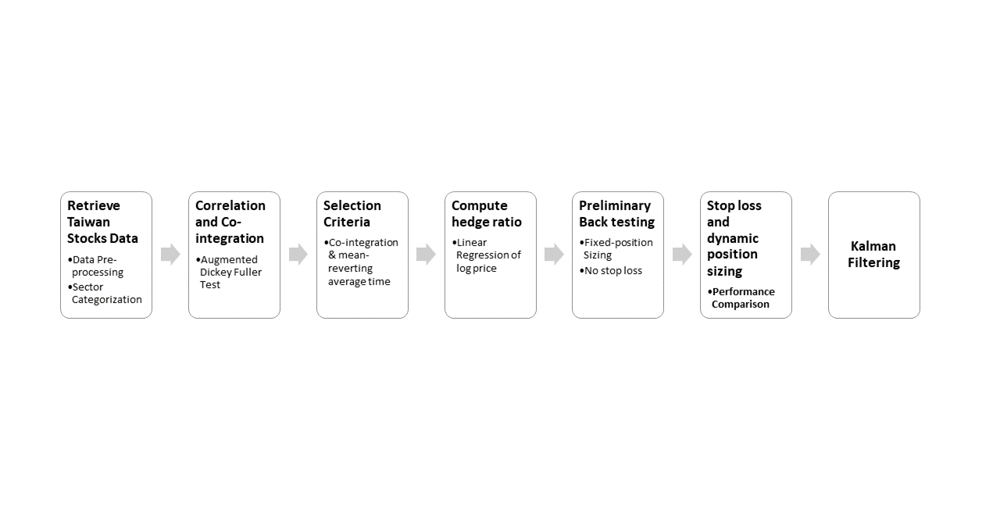

In [5]:
Image(filename="./Flowchart.PNG")

### 1. Retrieve Taiwan Stocks Data

#### Import Function and Libraries

The main source of data we will be using is from yahoo-finance which provides us with daily adjusted closing price. The main api is yfinance and we will merge the daily closing price as one dataframe.

In [9]:
import pandas as pd 
import numpy as np 
import yfinance as yf
from yahoofinancials import YahooFinancials
import datetime as dt
import matplotlib
import matplotlib.pyplot as plt
from Data_Retrieval import DataRetrieval
from CC_test import CCstudy
import itertools
from pandas_datareader import data as pdr
from yahooquery import Ticker

In [10]:
from pykalman import KalmanFilter
from statsmodels.tsa.stattools import coint
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.api import VAR

In [11]:
%load_ext autoreload
%autoreload 2

In [12]:
from Spread import Spread

In [13]:
from time import time
from pathlib import Path
from tqdm import tqdm 

import numpy as np
from numpy.linalg import LinAlgError
import pandas as pd

from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.tree import  DecisionTreeClassifier
from sklearn.linear_model import LogisticRegressionCV

from statsmodels.tsa.stattools import adfuller, coint
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.api import VAR

import matplotlib.pyplot as plt
import seaborn as sns

In [14]:
import warnings
warnings.filterwarnings('ignore')

#### Classification from Yahoo Query

Yahoo-query allows us to categorize the companies to their own sector and industry.

In [17]:
def classification(tickers):
    tickers = Ticker(tickers, asynchronous=True)
    
    datasi = tickers.get_modules("summaryProfile quoteType")
    dfsi = pd.DataFrame.from_dict(datasi).T
    dataframes = [pd.json_normalize([x for x in dfsi[module] if isinstance(x, dict)]) for
    module in ['summaryProfile', 'quoteType']]
    
    dfsi = pd.concat(dataframes, axis=1)
    
    dfsi = pd.DataFrame(dfsi.set_index('symbol'))
    dfsi=dfsi[['industry', 'sector']].reset_index()
    dfsi['symbol'].str.upper()
    return dfsi


#### Import TW exchange counters

In [19]:
counter_code = pd.read_csv('taiwan_stocks.csv')

In [20]:
tickers = list(counter_code.iloc[:,2])

In [21]:
tickers = list(counter_code.iloc[:,2].apply(lambda x: str(x)+".TW"))

In [22]:
tickers.append('TSM')

In [23]:
classlist = classification(tickers)

In [24]:
#tickers = ['2330.tw','0052.TW']
start_date = "2017-01-01"
end_date = "2022-12-31"

if tickers is not None:
    merged_df = DataRetrieval.retrieve_and_merge_data(tickers, start_date, end_date)
    display(merged_df)
else:
    print("Error: tickers is None")

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

,1303.TW,2002.TW,2303.TW,2330.TW,2881.TW,1301.TW,2324.TW,2409.TW,2880.TW,2882.TW,...,1905.TW,1513.TW,3005.TW,8112.TW,1503.TW,6139.TW,5876.TW,6505.TW,6526.TW,TSM
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-03,47.744904,18.155308,7.756602,146.720367,28.924669,62.056217,11.817387,9.065210,9.712662,33.428658,...,7.900723,14.171648,24.109898,12.488033,32.763050,25.612844,18.710472,83.657333,NaN,23.738073
2017-01-04,48.080193,18.340946,7.722583,146.720367,28.755844,62.193966,11.817387,9.027439,9.682777,33.359016,...,7.866373,14.171648,24.263853,12.657774,32.763050,26.067715,18.842136,83.657333,NaN,23.729975
2017-01-05,49.220169,18.452328,7.756602,147.121277,28.924669,62.262840,11.912430,9.254069,9.772432,33.707233,...,8.433164,14.756044,24.633352,12.827515,32.803543,25.717812,18.814419,84.803329,NaN,24.134918
2017-01-06,49.220169,18.340946,7.892683,147.522095,29.037210,62.331715,11.880750,9.480700,9.802317,33.950981,...,8.544804,15.011720,24.356228,12.851763,32.803543,25.647835,18.897575,83.275337,NaN,23.997236
2017-01-09,49.488400,18.229563,7.892683,147.522095,29.093487,62.125095,11.817387,9.707330,9.832203,34.125092,...,8.355874,14.938669,25.341568,12.997254,32.398563,25.053001,18.918367,83.275337,NaN,24.329298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,67.603493,29.110538,37.009628,439.636139,48.869213,81.555214,21.237062,14.137061,20.804045,38.802715,...,16.118553,63.613621,39.275623,30.166748,58.065128,35.414677,40.638802,76.884575,NaN,72.436699
2022-12-27,67.887535,28.825140,36.965462,440.117645,49.127323,81.836754,21.237062,14.137061,20.896095,38.944679,...,16.217440,64.474556,39.140503,30.250895,59.335915,35.368683,40.823315,77.554787,NaN,71.885384
2022-12-28,67.603493,29.110538,36.038013,434.339264,48.783169,81.555214,21.190895,13.817838,20.665964,38.471474,...,16.019667,64.091919,38.870258,30.124672,58.749393,35.552658,40.731060,77.076065,NaN,70.666656


In [25]:
merged_df = merged_df.dropna(axis=1, how='any')

In [26]:
merged_df

,1303.TW,2002.TW,2303.TW,2330.TW,2881.TW,1301.TW,2324.TW,2409.TW,2880.TW,2882.TW,...,1795.TW,1905.TW,1513.TW,3005.TW,8112.TW,1503.TW,6139.TW,5876.TW,6505.TW,TSM
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-03,47.744904,18.155308,7.756602,146.720367,28.924669,62.056217,11.817387,9.065210,9.712662,33.428658,...,56.543301,7.900723,14.171648,24.109898,12.488033,32.763050,25.612844,18.710472,83.657333,23.738073
2017-01-04,48.080193,18.340946,7.722583,146.720367,28.755844,62.193966,11.817387,9.027439,9.682777,33.359016,...,57.592171,7.866373,14.171648,24.263853,12.657774,32.763050,26.067715,18.842136,83.657333,23.729975
2017-01-05,49.220169,18.452328,7.756602,147.121277,28.924669,62.262840,11.912430,9.254069,9.772432,33.707233,...,58.164272,8.433164,14.756044,24.633352,12.827515,32.803543,25.717812,18.814419,84.803329,24.134918
2017-01-06,49.220169,18.340946,7.892683,147.522095,29.037210,62.331715,11.880750,9.480700,9.802317,33.950981,...,57.306110,8.544804,15.011720,24.356228,12.851763,32.803543,25.647835,18.897575,83.275337,23.997236
2017-01-09,49.488400,18.229563,7.892683,147.522095,29.093487,62.125095,11.817387,9.707330,9.832203,34.125092,...,55.780491,8.355874,14.938669,25.341568,12.997254,32.398563,25.053001,18.918367,83.275337,24.329298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,67.603493,29.110538,37.009628,439.636139,48.869213,81.555214,21.237062,14.137061,20.804045,38.802715,...,233.449463,16.118553,63.613621,39.275623,30.166748,58.065128,35.414677,40.638802,76.884575,72.436699
2022-12-27,67.887535,28.825140,36.965462,440.117645,49.127323,81.836754,21.237062,14.137061,20.896095,38.944679,...,230.537415,16.217440,64.474556,39.140503,30.250895,59.335915,35.368683,40.823315,77.554787,71.885384
2022-12-28,67.603493,29.110538,36.038013,434.339264,48.783169,81.555214,21.190895,13.817838,20.665964,38.471474,...,231.508087,16.019667,64.091919,38.870258,30.124672,58.749393,35.552658,40.731060,77.076065,70.666656


### Correlation and Cointegration Study 


Cointegration Test Results:


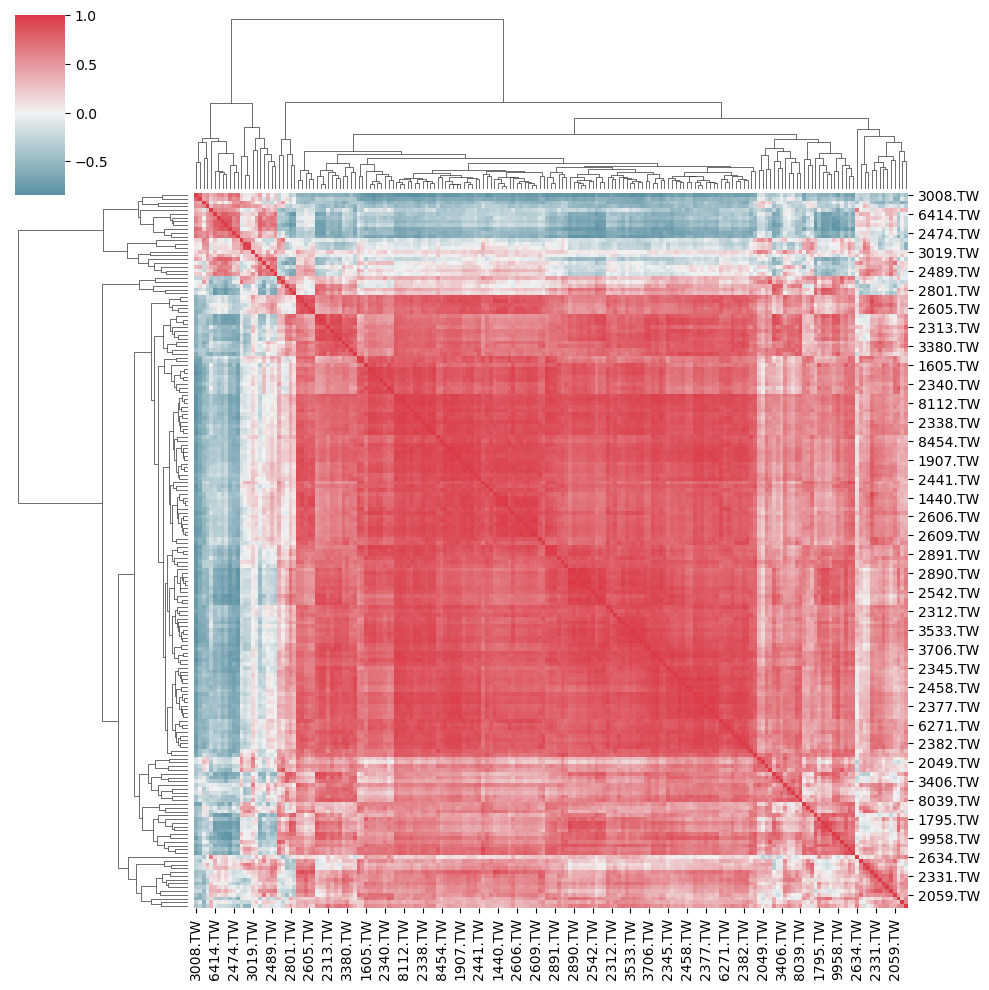

In [28]:
cc_study = CCstudy(merged_df)
table = cc_study.main()

In [29]:
table.sort_values(by=['Cointegration result','correlation'],ascending =[True,False])

,ticker1,ticker2,Cointegration result,correlation
901,2881.TW,2606.TW,0.000007,0.932307
4886,2317.TW,2337.TW,0.000014,0.622484
16114,3406.TW,9914.TW,0.000026,0.600561
15997,3044.TW,3406.TW,0.000042,0.743369
5088,2337.TW,2392.TW,0.000046,0.724978
...,...,...,...,...
2760,1605.TW,2313.TW,0.979942,0.650554
6003,2892.TW,2049.TW,0.980295,0.175456
2776,1605.TW,2455.TW,0.981609,0.246230
2715,1605.TW,2323.TW,0.986513,0.258843


In [30]:
table1 =table[(table['Cointegration result'] < 0.005) & (table['correlation'] > 0.7)].sort_values(by=['correlation','Cointegration result'],ascending =[False,True])

In [31]:
def categorize(classlist,column,counter):
    if column == 'industry':
        a=pd.DataFrame(dict(classlist.iloc[:,0:2]))
        return table[counter].map(a.set_index('symbol')[column])
    elif column == 'sector':
        b= pd.DataFrame(dict(classlist.iloc[:,[0,2]]))
        return table[counter].map(b.set_index('symbol')[column])
    else:
        return 'Error'

In [32]:
table1['ticker1_industry'] = categorize(classlist,'sector','ticker1')
table1['ticker2_industry'] = categorize(classlist,'sector','ticker2')


In [33]:
table1

,ticker1,ticker2,Cointegration result,correlation,ticker1_industry,ticker2_industry
1215,2324.TW,3702.TW,0.000253,0.969883,Technology,Technology
7061,1210.TW,2377.TW,0.002595,0.933724,Consumer Defensive,Technology
901,2881.TW,2606.TW,0.000007,0.932307,Financial Services,Industrials
7726,1440.TW,2606.TW,0.000602,0.932039,Consumer Cyclical,Industrials
12811,2542.TW,1503.TW,0.001441,0.920047,Real Estate,Industrials
10224,2344.TW,6116.TW,0.003378,0.919033,Technology,Technology
10703,2377.TW,6257.TW,0.004254,0.915669,Technology,Technology
10950,2385.TW,3706.TW,0.001259,0.912537,Technology,Technology
5435,2382.TW,3380.TW,0.002357,0.912452,Technology,Technology
10611,2376.TW,1609.TW,0.004474,0.912092,Technology,Industrials


### Selection of pair trading

In order to remove any industry specific systematic risk, the first criteria should be that the pair of stocks should belong to the same industry. Next, we shall run the time series spread graph.

In [36]:
Pair = []
for index, row in table1.iterrows():
    if row['ticker1_industry'] == row['ticker2_industry']:
        Pair.append([row['ticker1'],row['ticker2']])

In [37]:
Pair

[['2324.TW', '3702.TW'],
 ['2344.TW', '6116.TW'],
 ['2377.TW', '6257.TW'],
 ['2385.TW', '3706.TW'],
 ['2382.TW', '3380.TW'],
 ['2385.TW', '3044.TW'],
 ['6271.TW', '8150.TW'],
 ['2449.TW', '6271.TW'],
 ['3231.TW', '3380.TW'],
 ['2376.TW', '3443.TW'],
 ['2382.TW', '6271.TW'],
 ['2357.TW', '2344.TW'],
 ['2312.TW', '3706.TW'],
 ['8039.TW', '6269.TW'],
 ['2312.TW', '3005.TW'],
 ['6239.TW', '8039.TW'],
 ['2408.TW', '2337.TW'],
 ['3406.TW', '6269.TW'],
 ['8039.TW', '3406.TW'],
 ['2312.TW', '2385.TW'],
 ['3044.TW', '3406.TW'],
 ['2337.TW', '6239.TW'],
 ['2337.TW', '8039.TW'],
 ['8163.TW', '2360.TW'],
 ['2337.TW', '2441.TW'],
 ['2337.TW', '2313.TW'],
 ['2337.TW', '2392.TW'],
 ['2337.TW', '2360.TW'],
 ['3231.TW', '3406.TW'],
 ['2337.TW', '3711.TW'],
 ['6239.TW', '3406.TW'],
 ['3406.TW', '4958.TW'],
 ['2337.TW', '2449.TW']]

Statistics for the spread between 2324.TW and 3702.TW: 
  Ticker 1 Ticker 2  Volatility      Mean  90th Percentile  10th Percentile  \
0  2324.TW  3702.TW    0.232712 -4.521646        -4.114401        -4.928892   

   Revert Time  
0    84.607143  


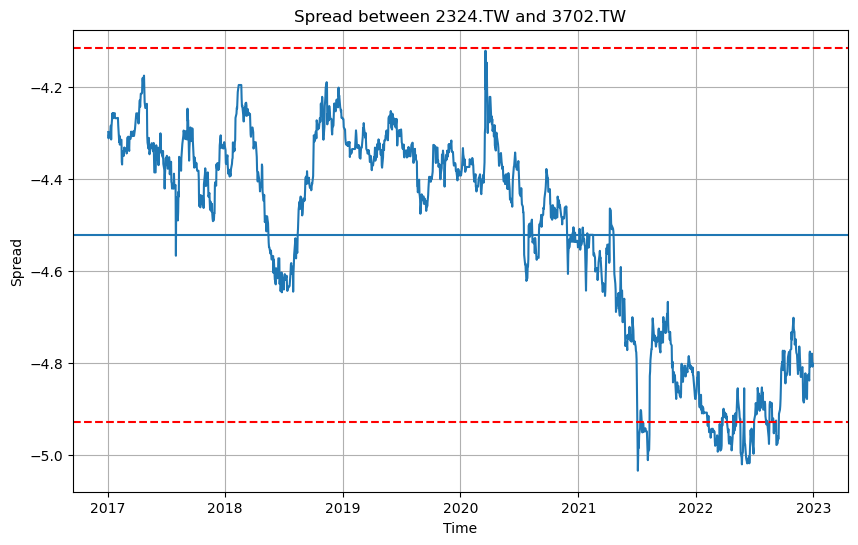

Statistics for the spread between 2344.TW and 6116.TW: 
  Ticker 1 Ticker 2  Volatility      Mean  90th Percentile  10th Percentile  \
0  2324.TW  3702.TW    0.232712 -4.521646        -4.114401        -4.928892   
1  2344.TW  6116.TW    0.177728  1.656791         1.967815         1.345767   

   Revert Time  
0    84.607143  
1    50.000000  


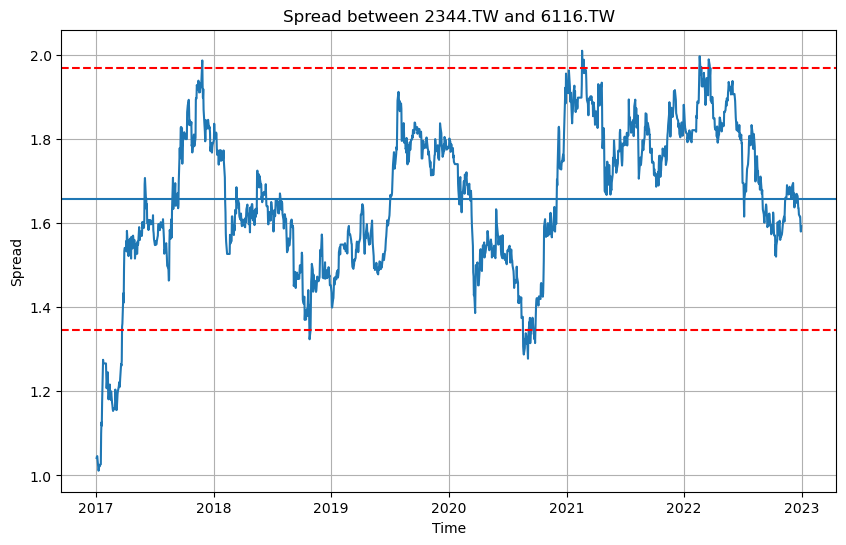

Statistics for the spread between 2377.TW and 6257.TW: 
  Ticker 1 Ticker 2  Volatility      Mean  90th Percentile  10th Percentile  \
0  2324.TW  3702.TW    0.232712 -4.521646        -4.114401        -4.928892   
1  2344.TW  6116.TW    0.177728  1.656791         1.967815         1.345767   
2  2377.TW  6257.TW    0.228029  3.186813         3.585863         2.787763   

   Revert Time  
0    84.607143  
1    50.000000  
2   102.695652  


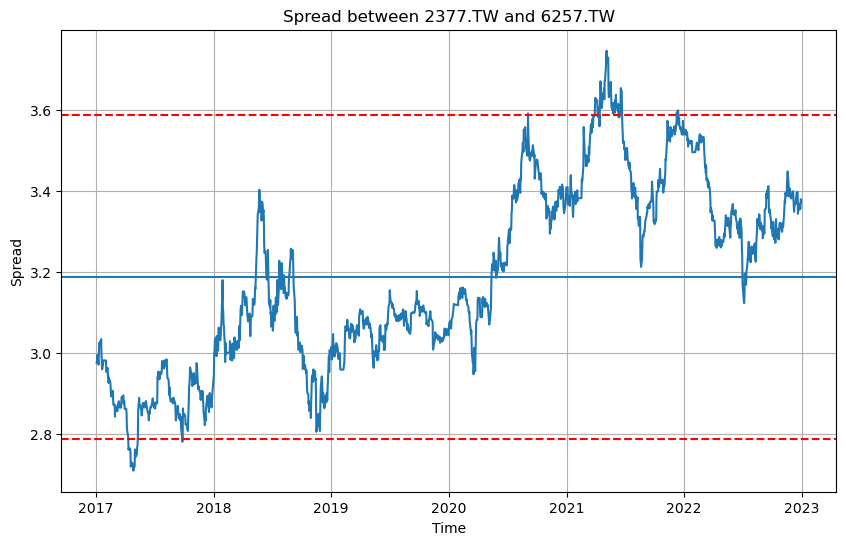

Statistics for the spread between 2385.TW and 3706.TW: 
  Ticker 1 Ticker 2  Volatility      Mean  90th Percentile  10th Percentile  \
0  2324.TW  3702.TW    0.232712 -4.521646        -4.114401        -4.928892   
1  2344.TW  6116.TW    0.177728  1.656791         1.967815         1.345767   
2  2377.TW  6257.TW    0.228029  3.186813         3.585863         2.787763   
3  2385.TW  3706.TW    0.123838  2.961622         3.178338         2.744906   

   Revert Time  
0    84.607143  
1    50.000000  
2   102.695652  
3    41.823529  


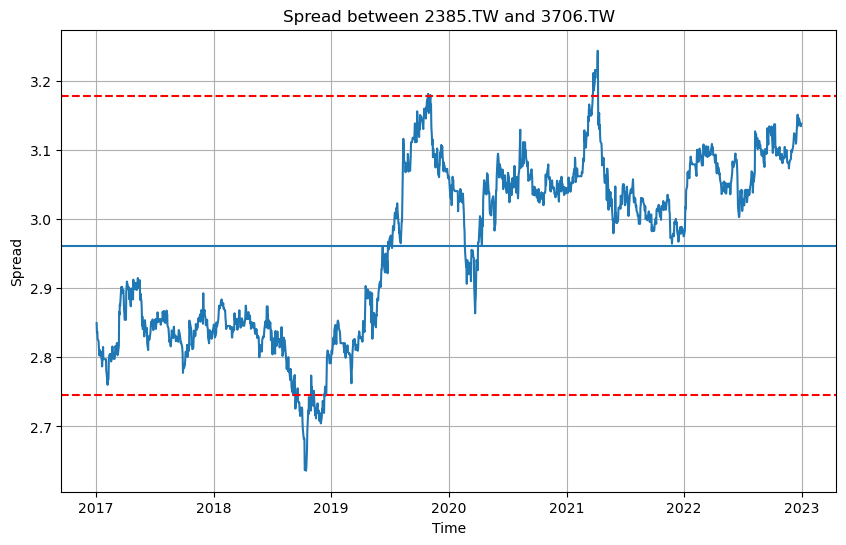

Statistics for the spread between 2382.TW and 3380.TW: 
  Ticker 1 Ticker 2  Volatility      Mean  90th Percentile  10th Percentile  \
0  2324.TW  3702.TW    0.232712 -4.521646        -4.114401        -4.928892   
1  2344.TW  6116.TW    0.177728  1.656791         1.967815         1.345767   
2  2377.TW  6257.TW    0.228029  3.186813         3.585863         2.787763   
3  2385.TW  3706.TW    0.123838  2.961622         3.178338         2.744906   
4  2382.TW  3380.TW    0.179614  2.853708         3.168032         2.539384   

   Revert Time  
0    84.607143  
1    50.000000  
2   102.695652  
3    41.823529  
4    60.162162  


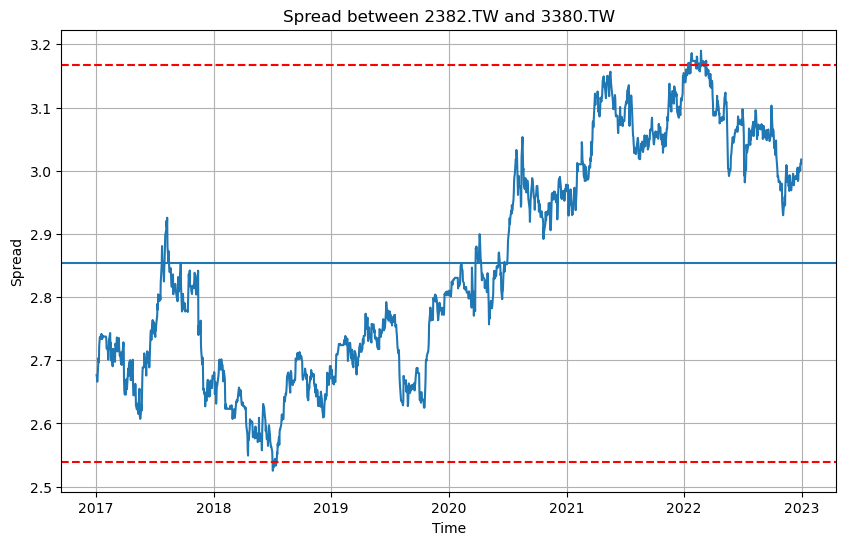

Statistics for the spread between 2385.TW and 3044.TW: 
  Ticker 1 Ticker 2  Volatility      Mean  90th Percentile  10th Percentile  \
0  2324.TW  3702.TW    0.232712 -4.521646        -4.114401        -4.928892   
1  2344.TW  6116.TW    0.177728  1.656791         1.967815         1.345767   
2  2377.TW  6257.TW    0.228029  3.186813         3.585863         2.787763   
3  2385.TW  3706.TW    0.123838  2.961622         3.178338         2.744906   
4  2382.TW  3380.TW    0.179614  2.853708         3.168032         2.539384   
5  2385.TW  3044.TW    0.199226 -2.648670        -2.300025        -2.997314   

   Revert Time  
0    84.607143  
1    50.000000  
2   102.695652  
3    41.823529  
4    60.162162  
5    64.521739  


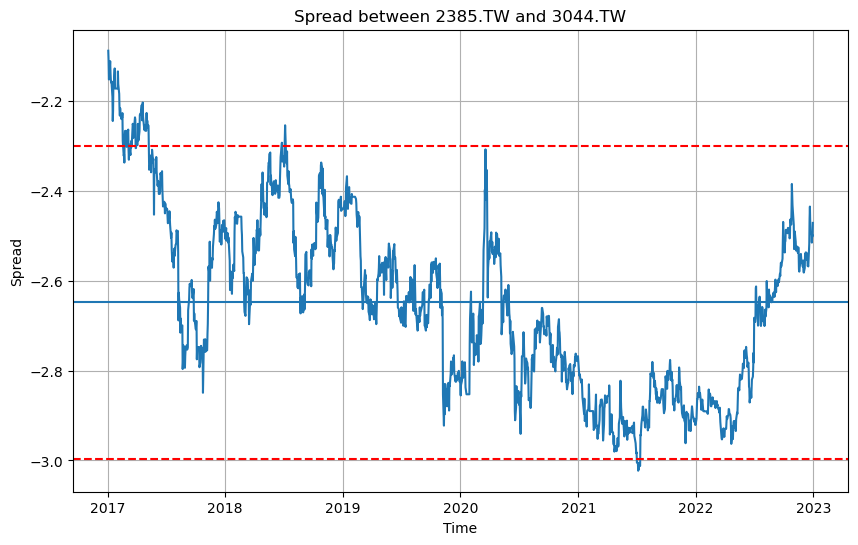

Statistics for the spread between 6271.TW and 8150.TW: 
  Ticker 1 Ticker 2  Volatility      Mean  90th Percentile  10th Percentile  \
0  2324.TW  3702.TW    0.232712 -4.521646        -4.114401        -4.928892   
1  2344.TW  6116.TW    0.177728  1.656791         1.967815         1.345767   
2  2377.TW  6257.TW    0.228029  3.186813         3.585863         2.787763   
3  2385.TW  3706.TW    0.123838  2.961622         3.178338         2.744906   
4  2382.TW  3380.TW    0.179614  2.853708         3.168032         2.539384   
5  2385.TW  3044.TW    0.199226 -2.648670        -2.300025        -2.997314   
6  6271.TW  8150.TW    0.219941  4.224035         4.608931         3.839139   

   Revert Time  
0    84.607143  
1    50.000000  
2   102.695652  
3    41.823529  
4    60.162162  
5    64.521739  
6    54.113636  


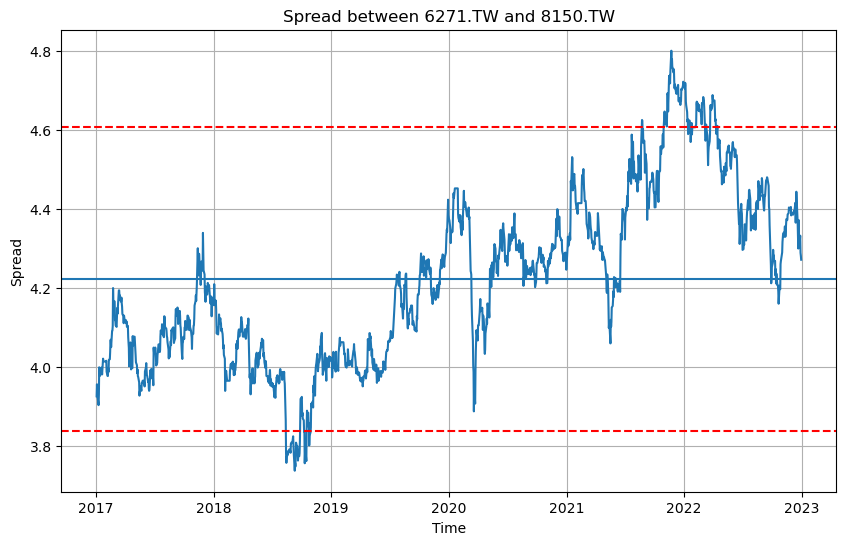

Statistics for the spread between 2449.TW and 6271.TW: 
  Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0  2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1  2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2  2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3  2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4  2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5  2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6  6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7  2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   

   Revert Time  
0    84.607143  
1    50.000000  
2   102.695652  
3    41.823529  
4    60.162162  
5    64.521739  
6    54.113636  
7    68.852941  


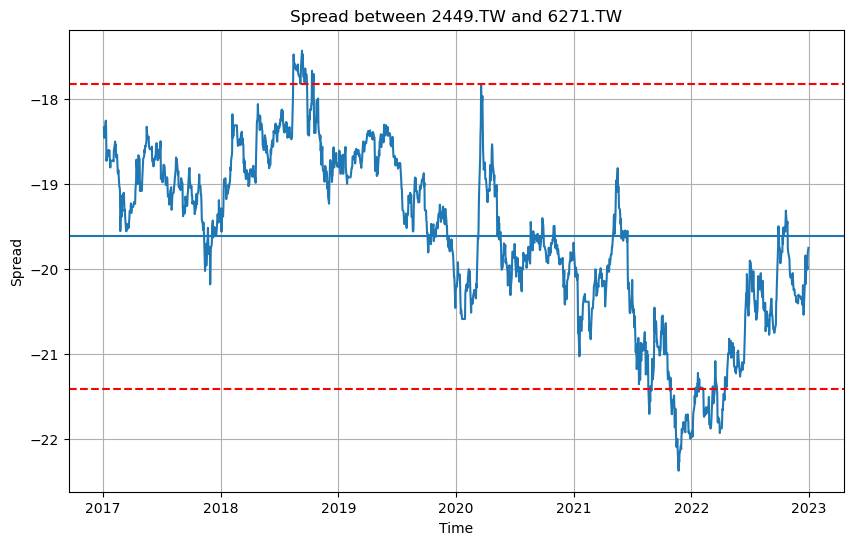

Statistics for the spread between 3231.TW and 3380.TW: 
  Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0  2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1  2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2  2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3  2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4  2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5  2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6  6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7  2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8  3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   

   Revert Time  
0    84.607143  
1    50.000000  
2   102.695652  
3    41.823529  
4    60.162162  
5    64.521739  
6    54.113636  
7    68

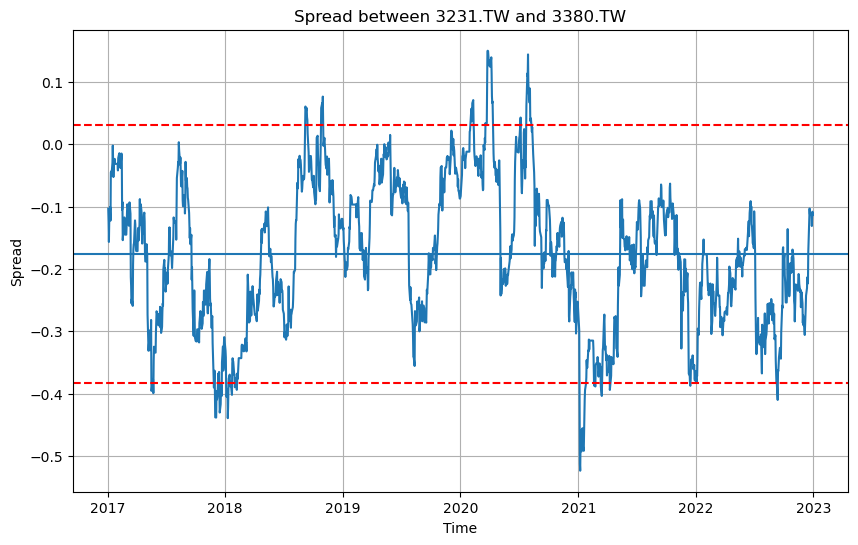

Statistics for the spread between 2376.TW and 3443.TW: 
  Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0  2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1  2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2  2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3  2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4  2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5  2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6  6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7  2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8  3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9  2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   

   Revert Time  
0    84.607143  
1    50.000000  
2   102.6956

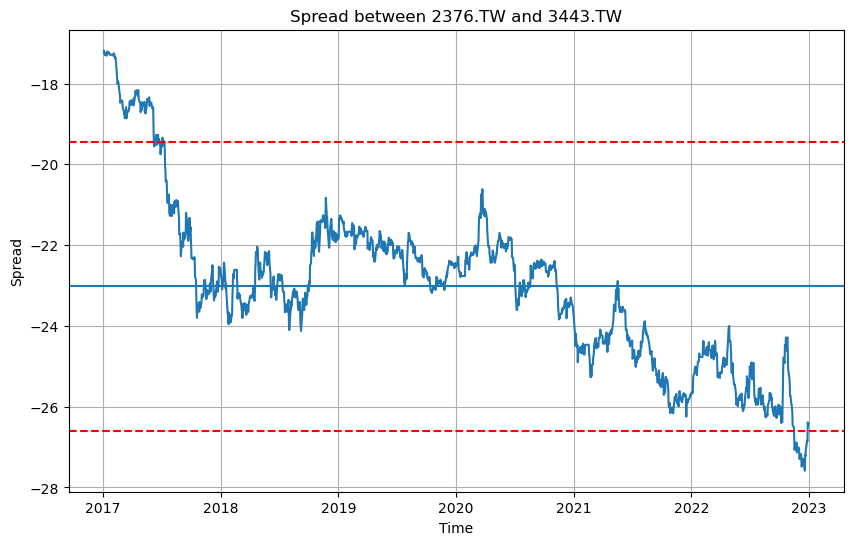

Statistics for the spread between 2382.TW and 6271.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

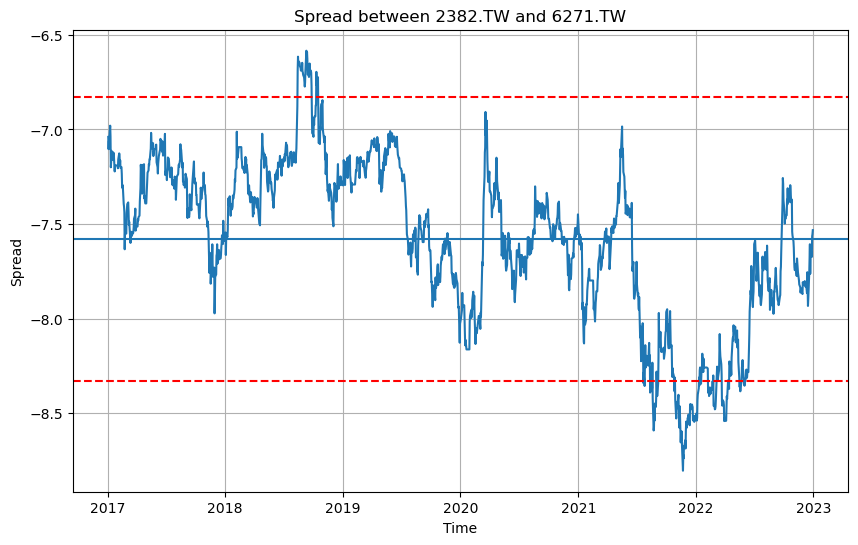

Statistics for the spread between 2357.TW and 2344.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

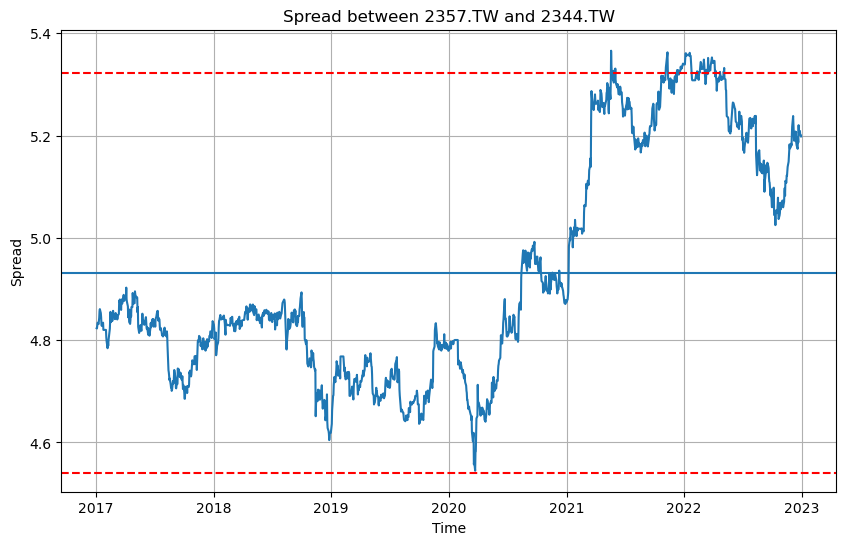

Statistics for the spread between 2312.TW and 3706.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

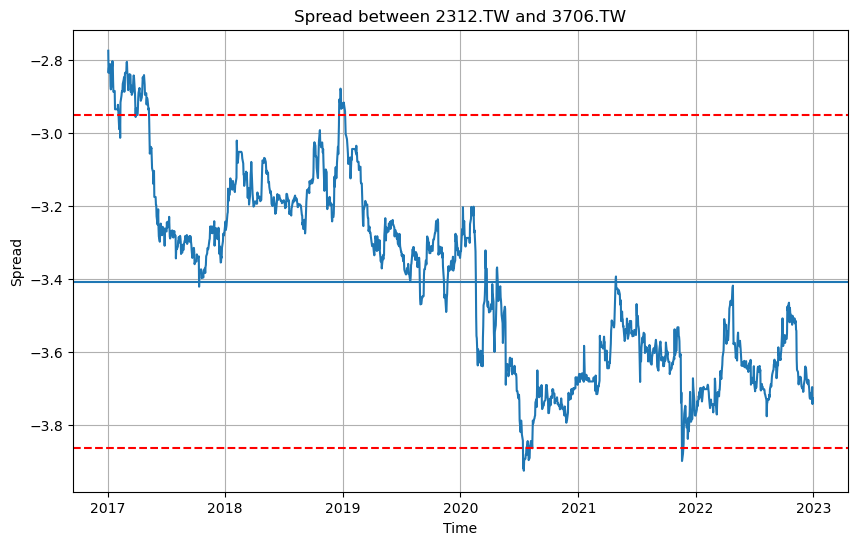

Statistics for the spread between 8039.TW and 6269.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

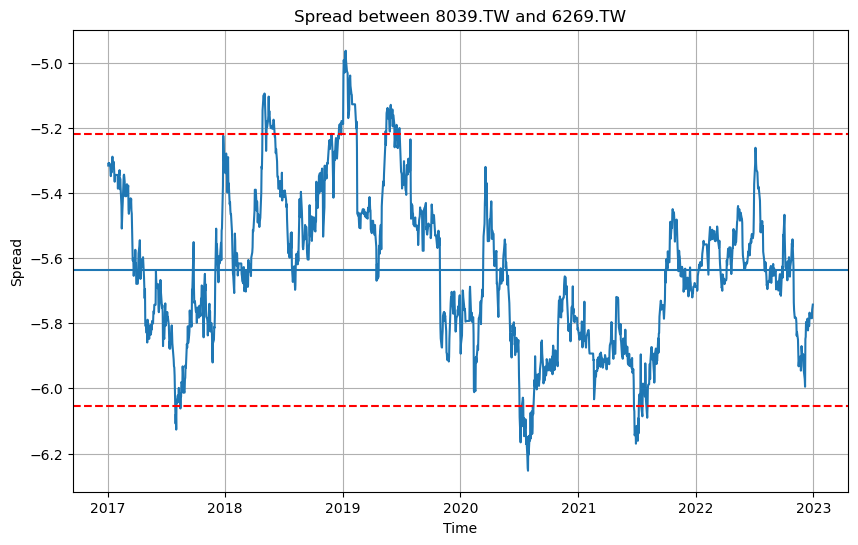

Statistics for the spread between 2312.TW and 3005.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

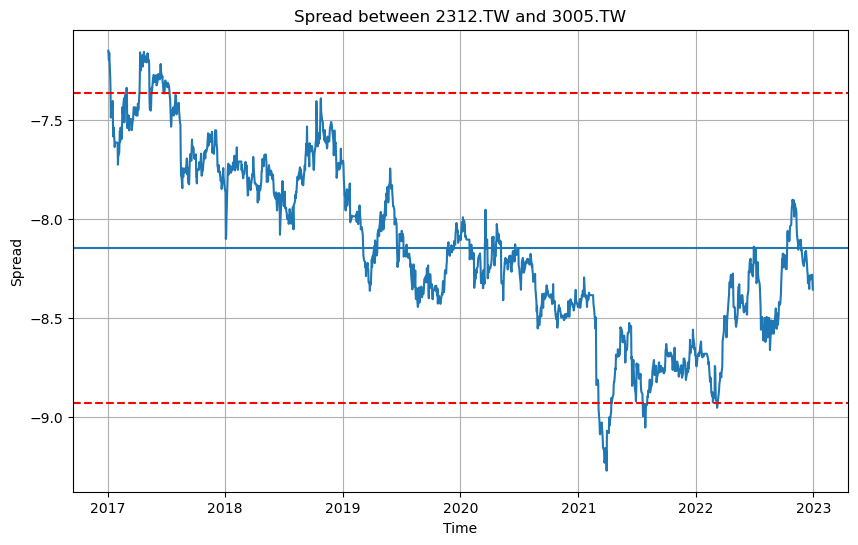

Statistics for the spread between 6239.TW and 8039.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

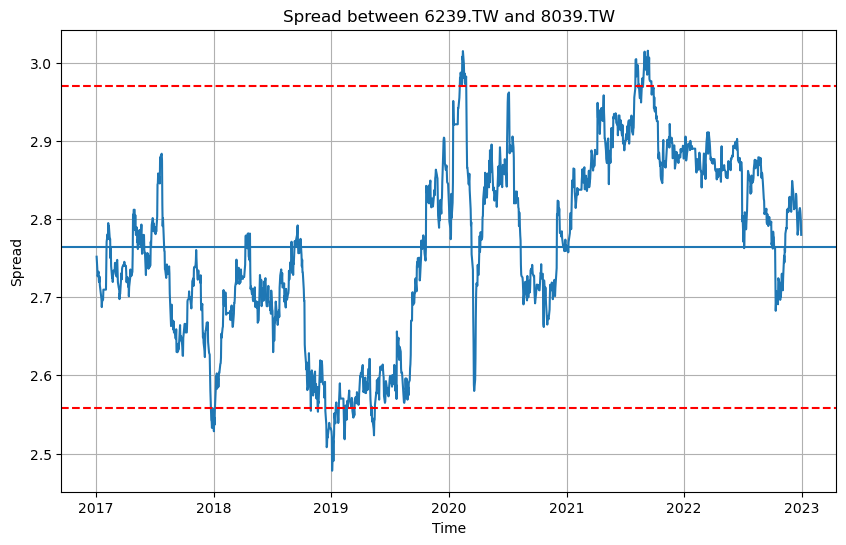

Statistics for the spread between 2408.TW and 2337.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

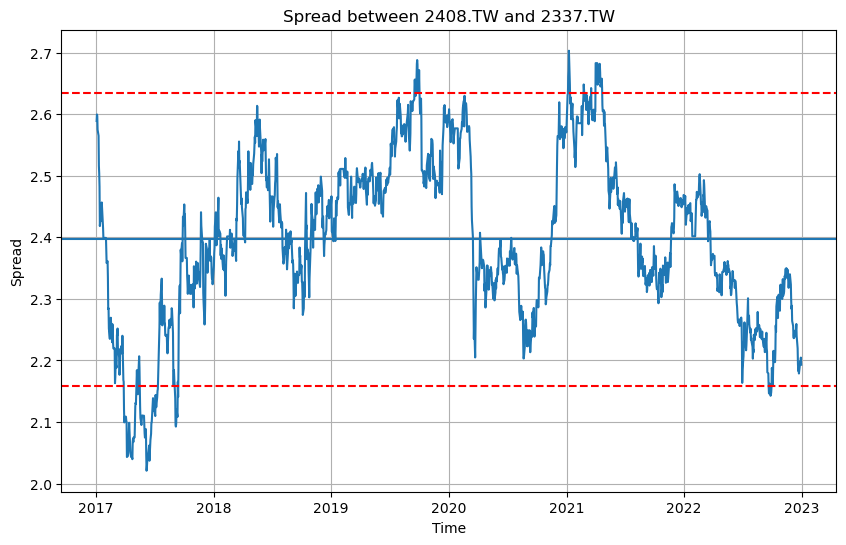

Statistics for the spread between 3406.TW and 6269.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

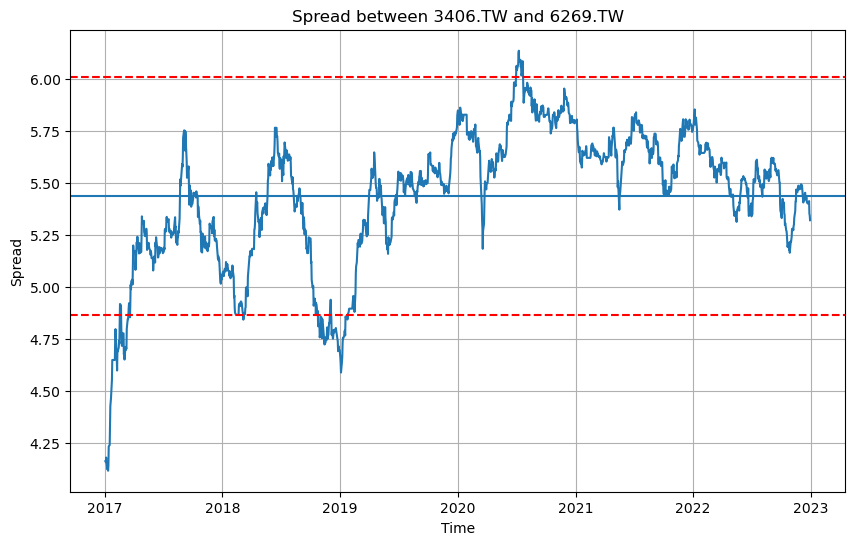

Statistics for the spread between 8039.TW and 3406.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

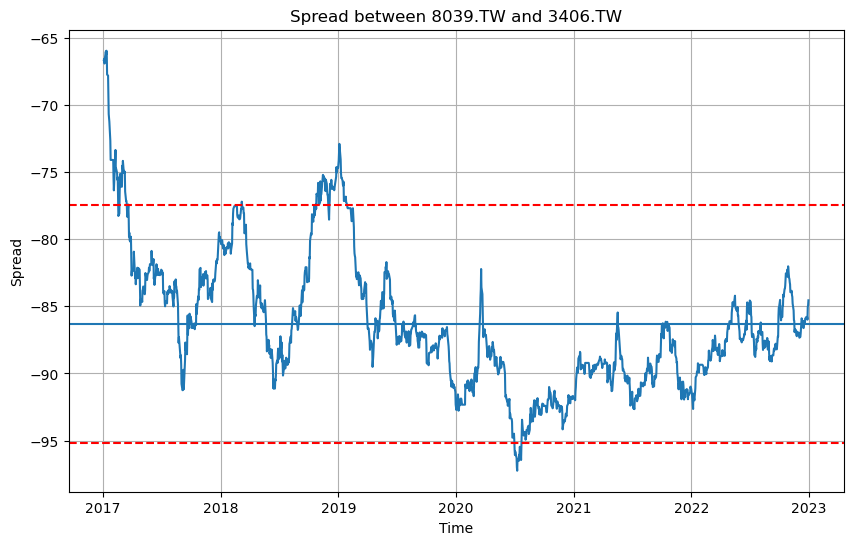

Statistics for the spread between 2312.TW and 2385.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

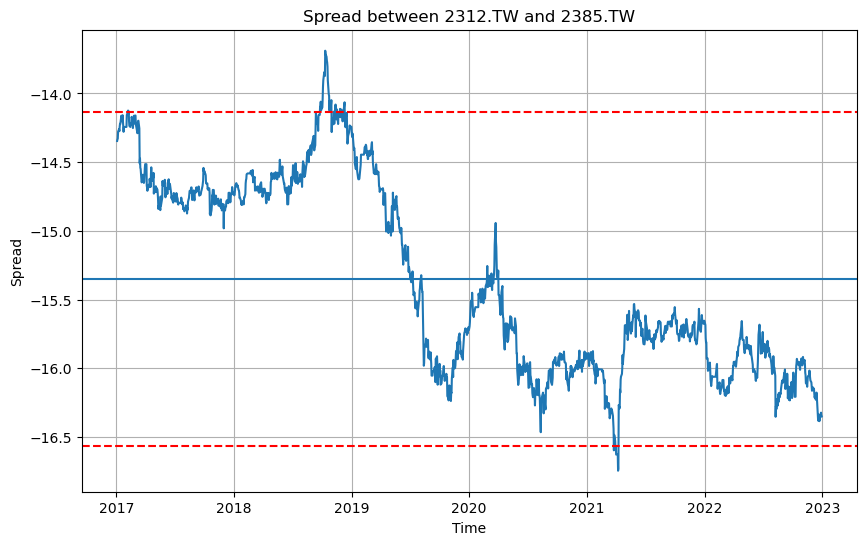

Statistics for the spread between 3044.TW and 3406.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

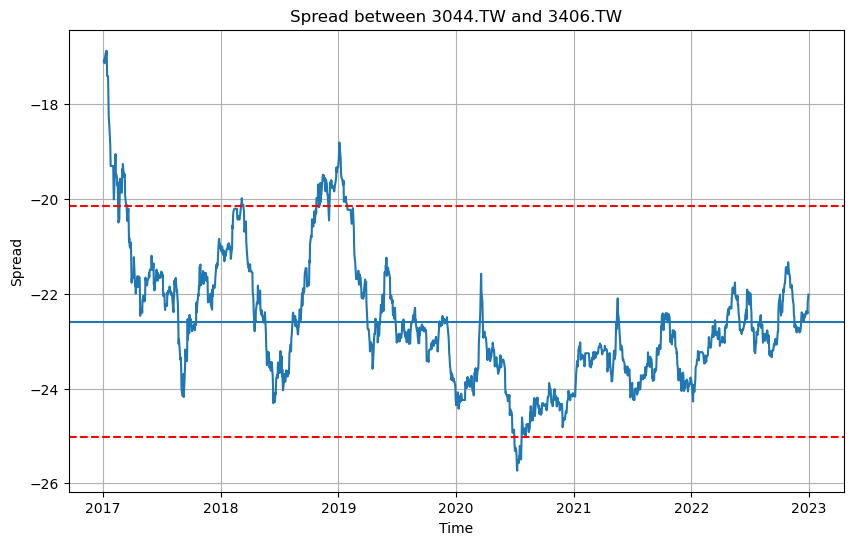

Statistics for the spread between 2337.TW and 6239.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

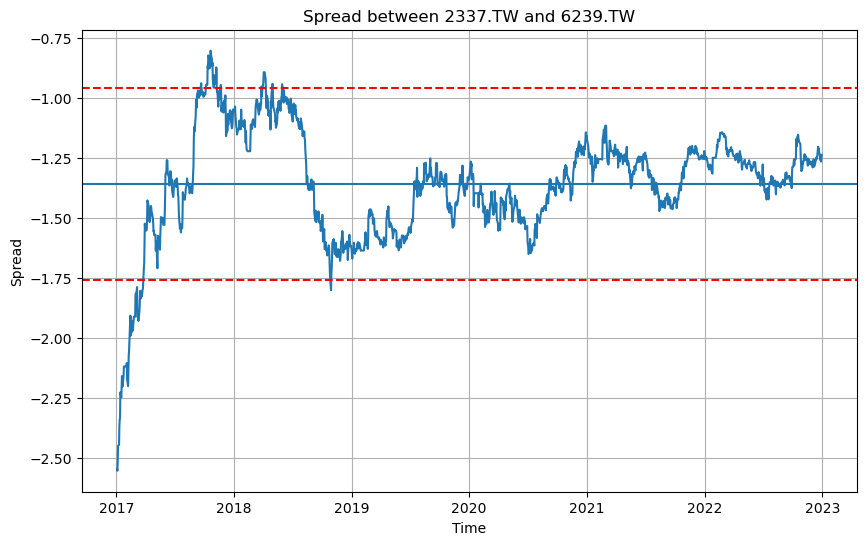

Statistics for the spread between 2337.TW and 8039.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

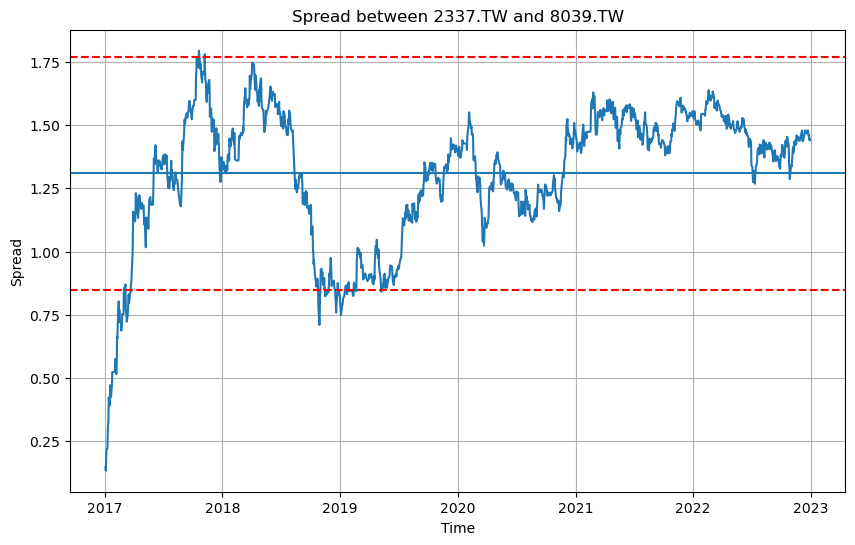

Statistics for the spread between 8163.TW and 2360.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

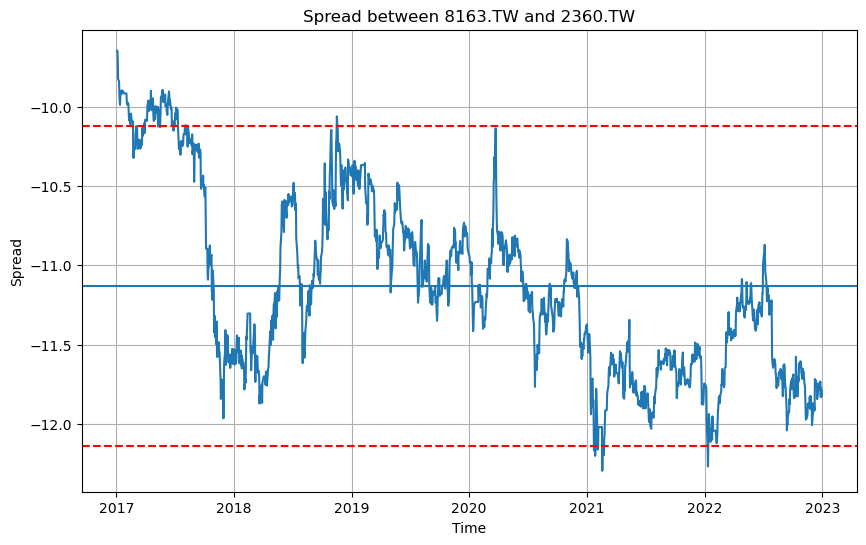

Statistics for the spread between 2337.TW and 2441.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

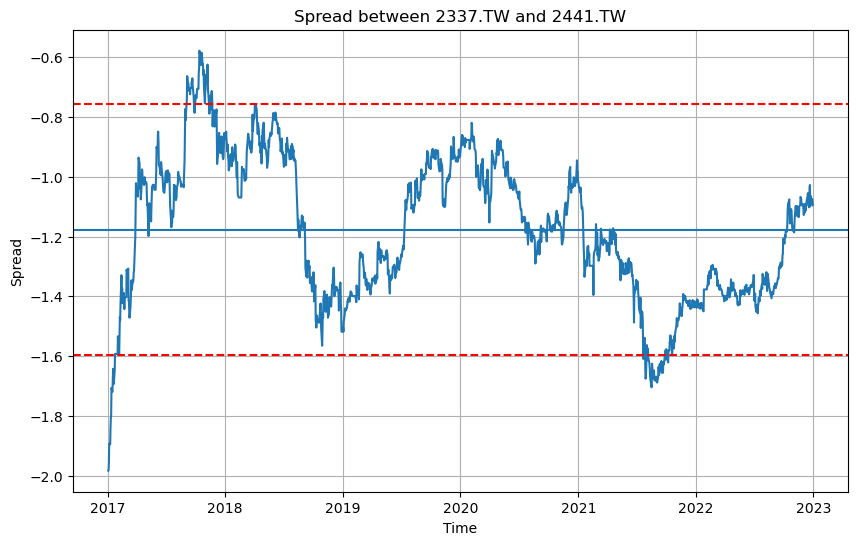

Statistics for the spread between 2337.TW and 2313.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

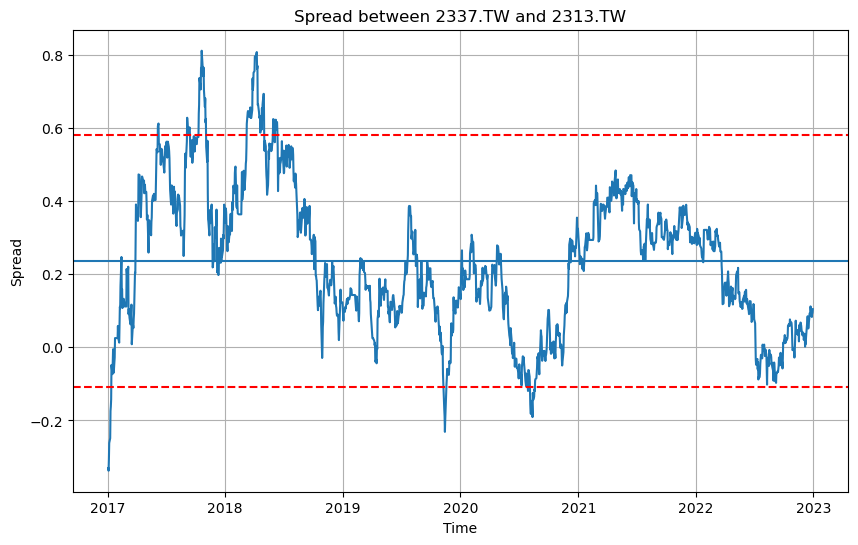

Statistics for the spread between 2337.TW and 2392.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

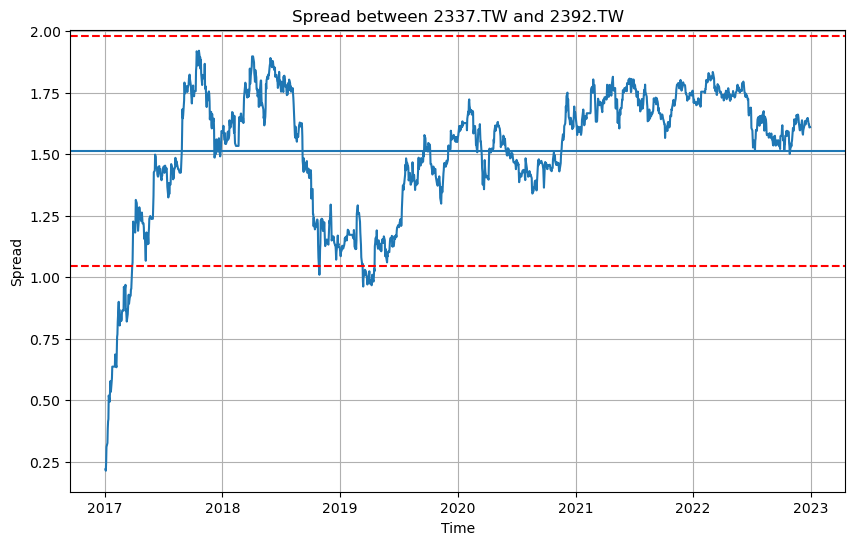

Statistics for the spread between 2337.TW and 2360.TW: 
   Ticker 1 Ticker 2  Volatility       Mean  90th Percentile  10th Percentile  \
0   2324.TW  3702.TW    0.232712  -4.521646        -4.114401        -4.928892   
1   2344.TW  6116.TW    0.177728   1.656791         1.967815         1.345767   
2   2377.TW  6257.TW    0.228029   3.186813         3.585863         2.787763   
3   2385.TW  3706.TW    0.123838   2.961622         3.178338         2.744906   
4   2382.TW  3380.TW    0.179614   2.853708         3.168032         2.539384   
5   2385.TW  3044.TW    0.199226  -2.648670        -2.300025        -2.997314   
6   6271.TW  8150.TW    0.219941   4.224035         4.608931         3.839139   
7   2449.TW  6271.TW    1.026174 -19.618101       -17.822297       -21.413905   
8   3231.TW  3380.TW    0.117779  -0.176105         0.030008        -0.382217   
9   2376.TW  3443.TW    2.044698 -23.013913       -19.435692       -26.592134   
10  2382.TW  6271.TW    0.430167  -7.578968        -6

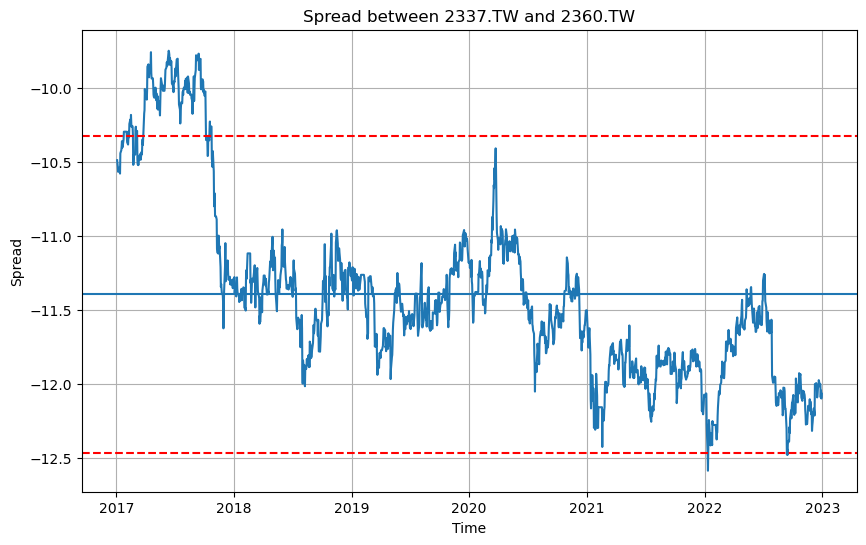

Statistics for the spread between 3231.TW and 3406.TW: 
   Ticker 1 Ticker 2  Volatility        Mean  90th Percentile  \
0   2324.TW  3702.TW    0.232712   -4.521646        -4.114401   
1   2344.TW  6116.TW    0.177728    1.656791         1.967815   
2   2377.TW  6257.TW    0.228029    3.186813         3.585863   
3   2385.TW  3706.TW    0.123838    2.961622         3.178338   
4   2382.TW  3380.TW    0.179614    2.853708         3.168032   
5   2385.TW  3044.TW    0.199226   -2.648670        -2.300025   
6   6271.TW  8150.TW    0.219941    4.224035         4.608931   
7   2449.TW  6271.TW    1.026174  -19.618101       -17.822297   
8   3231.TW  3380.TW    0.117779   -0.176105         0.030008   
9   2376.TW  3443.TW    2.044698  -23.013913       -19.435692   
10  2382.TW  6271.TW    0.430167   -7.578968        -6.826175   
11  2357.TW  2344.TW    0.223198    4.931433         5.322029   
12  2312.TW  3706.TW    0.260544   -3.406834        -2.950883   
13  8039.TW  6269.TW    0.239018  

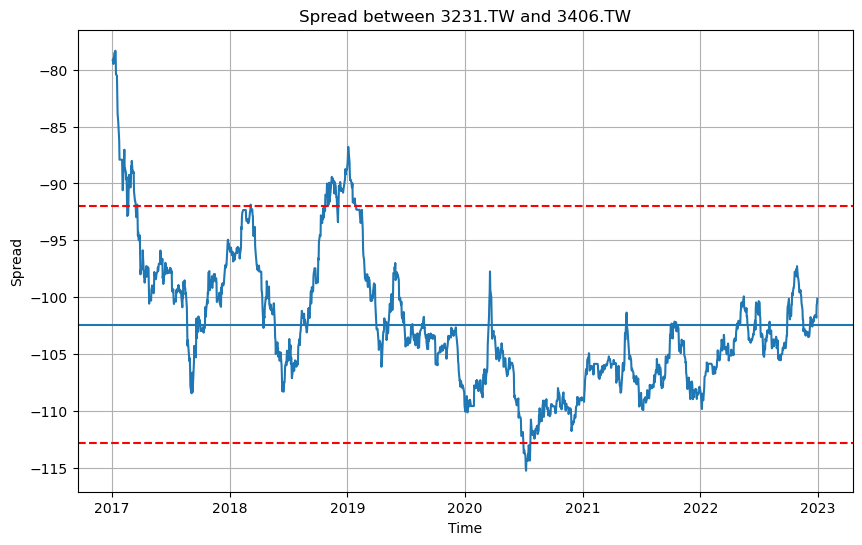

Statistics for the spread between 2337.TW and 3711.TW: 
   Ticker 1 Ticker 2  Volatility        Mean  90th Percentile  \
0   2324.TW  3702.TW    0.232712   -4.521646        -4.114401   
1   2344.TW  6116.TW    0.177728    1.656791         1.967815   
2   2377.TW  6257.TW    0.228029    3.186813         3.585863   
3   2385.TW  3706.TW    0.123838    2.961622         3.178338   
4   2382.TW  3380.TW    0.179614    2.853708         3.168032   
5   2385.TW  3044.TW    0.199226   -2.648670        -2.300025   
6   6271.TW  8150.TW    0.219941    4.224035         4.608931   
7   2449.TW  6271.TW    1.026174  -19.618101       -17.822297   
8   3231.TW  3380.TW    0.117779   -0.176105         0.030008   
9   2376.TW  3443.TW    2.044698  -23.013913       -19.435692   
10  2382.TW  6271.TW    0.430167   -7.578968        -6.826175   
11  2357.TW  2344.TW    0.223198    4.931433         5.322029   
12  2312.TW  3706.TW    0.260544   -3.406834        -2.950883   
13  8039.TW  6269.TW    0.239018  

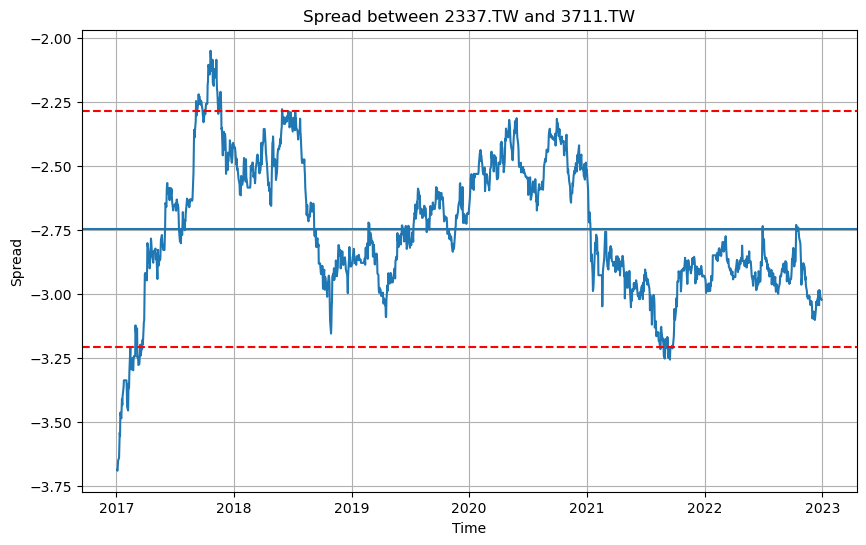

Statistics for the spread between 6239.TW and 3406.TW: 
   Ticker 1 Ticker 2  Volatility        Mean  90th Percentile  \
0   2324.TW  3702.TW    0.232712   -4.521646        -4.114401   
1   2344.TW  6116.TW    0.177728    1.656791         1.967815   
2   2377.TW  6257.TW    0.228029    3.186813         3.585863   
3   2385.TW  3706.TW    0.123838    2.961622         3.178338   
4   2382.TW  3380.TW    0.179614    2.853708         3.168032   
5   2385.TW  3044.TW    0.199226   -2.648670        -2.300025   
6   6271.TW  8150.TW    0.219941    4.224035         4.608931   
7   2449.TW  6271.TW    1.026174  -19.618101       -17.822297   
8   3231.TW  3380.TW    0.117779   -0.176105         0.030008   
9   2376.TW  3443.TW    2.044698  -23.013913       -19.435692   
10  2382.TW  6271.TW    0.430167   -7.578968        -6.826175   
11  2357.TW  2344.TW    0.223198    4.931433         5.322029   
12  2312.TW  3706.TW    0.260544   -3.406834        -2.950883   
13  8039.TW  6269.TW    0.239018  

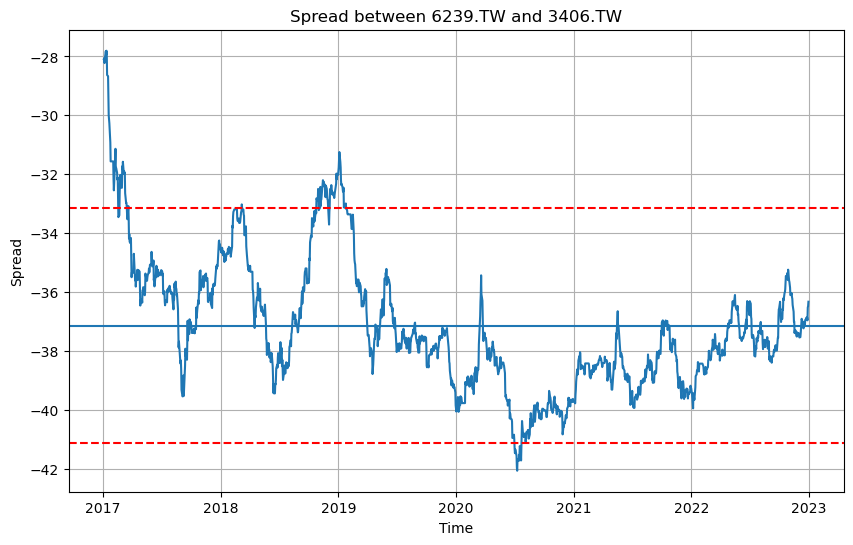

Statistics for the spread between 3406.TW and 4958.TW: 
   Ticker 1 Ticker 2  Volatility        Mean  90th Percentile  \
0   2324.TW  3702.TW    0.232712   -4.521646        -4.114401   
1   2344.TW  6116.TW    0.177728    1.656791         1.967815   
2   2377.TW  6257.TW    0.228029    3.186813         3.585863   
3   2385.TW  3706.TW    0.123838    2.961622         3.178338   
4   2382.TW  3380.TW    0.179614    2.853708         3.168032   
5   2385.TW  3044.TW    0.199226   -2.648670        -2.300025   
6   6271.TW  8150.TW    0.219941    4.224035         4.608931   
7   2449.TW  6271.TW    1.026174  -19.618101       -17.822297   
8   3231.TW  3380.TW    0.117779   -0.176105         0.030008   
9   2376.TW  3443.TW    2.044698  -23.013913       -19.435692   
10  2382.TW  6271.TW    0.430167   -7.578968        -6.826175   
11  2357.TW  2344.TW    0.223198    4.931433         5.322029   
12  2312.TW  3706.TW    0.260544   -3.406834        -2.950883   
13  8039.TW  6269.TW    0.239018  

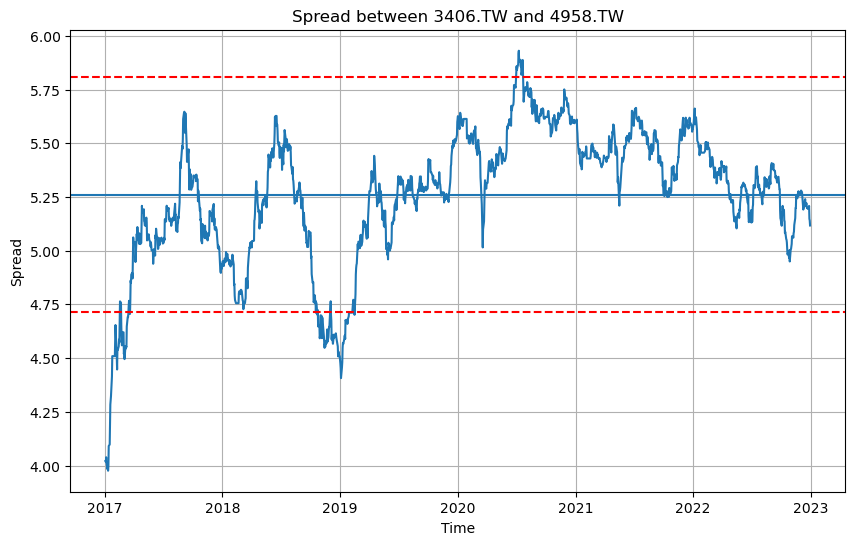

Statistics for the spread between 2337.TW and 2449.TW: 
   Ticker 1 Ticker 2  Volatility        Mean  90th Percentile  \
0   2324.TW  3702.TW    0.232712   -4.521646        -4.114401   
1   2344.TW  6116.TW    0.177728    1.656791         1.967815   
2   2377.TW  6257.TW    0.228029    3.186813         3.585863   
3   2385.TW  3706.TW    0.123838    2.961622         3.178338   
4   2382.TW  3380.TW    0.179614    2.853708         3.168032   
5   2385.TW  3044.TW    0.199226   -2.648670        -2.300025   
6   6271.TW  8150.TW    0.219941    4.224035         4.608931   
7   2449.TW  6271.TW    1.026174  -19.618101       -17.822297   
8   3231.TW  3380.TW    0.117779   -0.176105         0.030008   
9   2376.TW  3443.TW    2.044698  -23.013913       -19.435692   
10  2382.TW  6271.TW    0.430167   -7.578968        -6.826175   
11  2357.TW  2344.TW    0.223198    4.931433         5.322029   
12  2312.TW  3706.TW    0.260544   -3.406834        -2.950883   
13  8039.TW  6269.TW    0.239018  

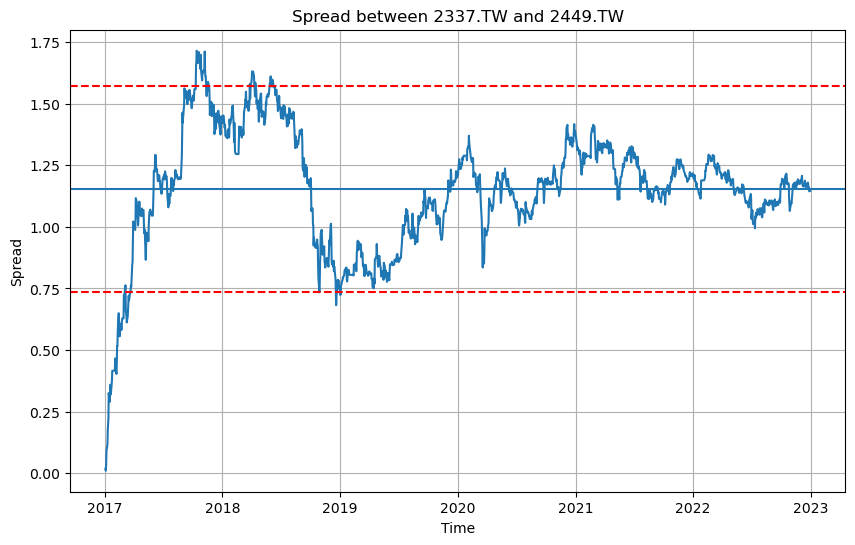

In [38]:
spread_calculator = Spread(merged_df)
Pairs = spread_calculator.calculate_spread_and_volatility(Pair)

### Selection based on number of days holding trade

#### Another criteria I added in is that I want to hold this long-short pair and realize profit as quick as possible ideally. Hence, I would set a threshold of 60 days at most. 

In [41]:
Filtered_Pairs = Pairs[Pairs['Revert Time'] <60]

In [42]:
Filtered_Pairs

,Ticker 1,Ticker 2,Volatility,Mean,90th Percentile,10th Percentile,Revert Time
1,2344.TW,6116.TW,0.177728,1.656791,1.967815,1.345767,50.000000
3,2385.TW,3706.TW,0.123838,2.961622,3.178338,2.744906,41.823529
6,6271.TW,8150.TW,0.219941,4.224035,4.608931,3.839139,54.113636
8,3231.TW,3380.TW,0.117779,-0.176105,0.030008,-0.382217,45.036364
10,2382.TW,6271.TW,0.430167,-7.578968,-6.826175,-8.331761,57.954545
19,2312.TW,2385.TW,0.695368,-15.350793,-14.133900,-16.567687,45.739130
23,8163.TW,2360.TW,0.575146,-11.132158,-10.125651,-12.138664,53.386364
24,2337.TW,2441.TW,0.240343,-1.177078,-0.756478,-1.597678,44.365385
25,2337.TW,2313.TW,0.197543,0.236077,0.581777,-0.109623,55.061224
26,2337.TW,2392.TW,0.267110,1.511575,1.979017,1.044133,52.871795


### Calculate hedging ratio 

In [44]:
FPairs= Filtered_Pairs[['Ticker 1', 'Ticker 2']].apply(pd.Series)

In [45]:
FPairs=FPairs[['Ticker 1', 'Ticker 2']]

In [46]:
FPairs

,Ticker 1,Ticker 2
1,2344.TW,6116.TW
3,2385.TW,3706.TW
6,6271.TW,8150.TW
8,3231.TW,3380.TW
10,2382.TW,6271.TW
19,2312.TW,2385.TW
23,8163.TW,2360.TW
24,2337.TW,2441.TW
25,2337.TW,2313.TW
26,2337.TW,2392.TW


In [47]:
import Hedge


# Now you can use the reloaded Hedge_ratio class
hedge_ratio_instance = Hedge.Hedge_ratio(FPairs, merged_df)
HR = hedge_ratio_instance.hedge(FPairs, merged_df)

### Backtest with signal 

#### Our signal will be when it hit the standard deviation then we will take position and unwind when it reaches the mean.

#### Assumption
1. Our price will be closing price
2. Not considering transaction cost
3. No borrowing cost consider might use SSF in TW to carry out this trade, assuming SSF same price and closing price 

In [50]:
from Backtest import Backtest
Backtest = Backtest(FPairs,merged_df,HR)

Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,66.878%
Cumulative returns,2261.712%
Annual volatility,137.061%
Sharpe ratio,1.02
Calmar ratio,0.73
Stability,0.33
Max drawdown,-91.354%


None

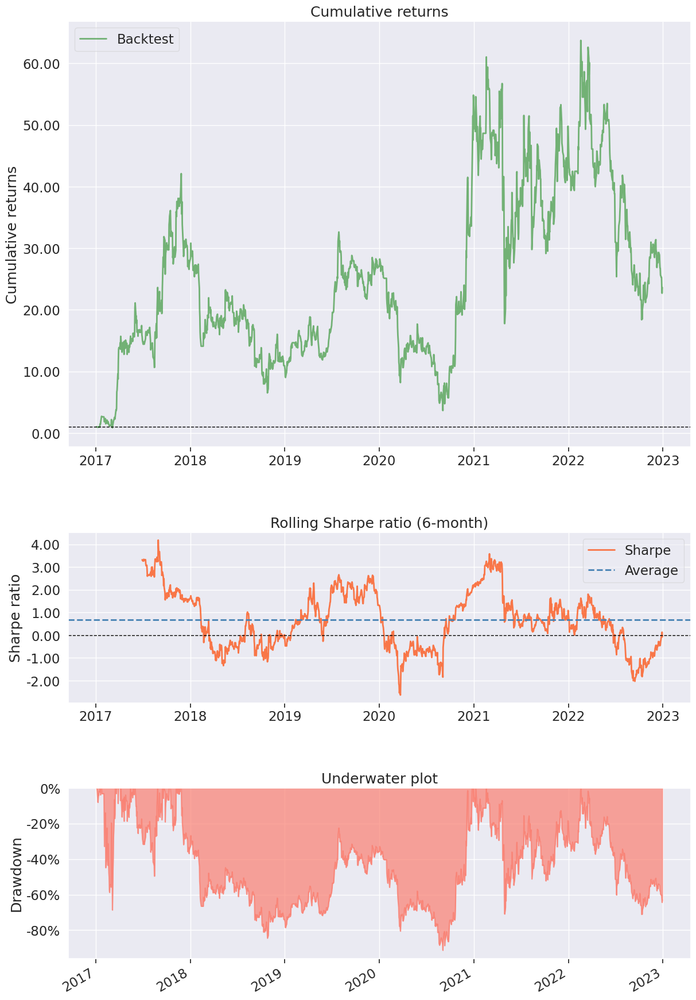

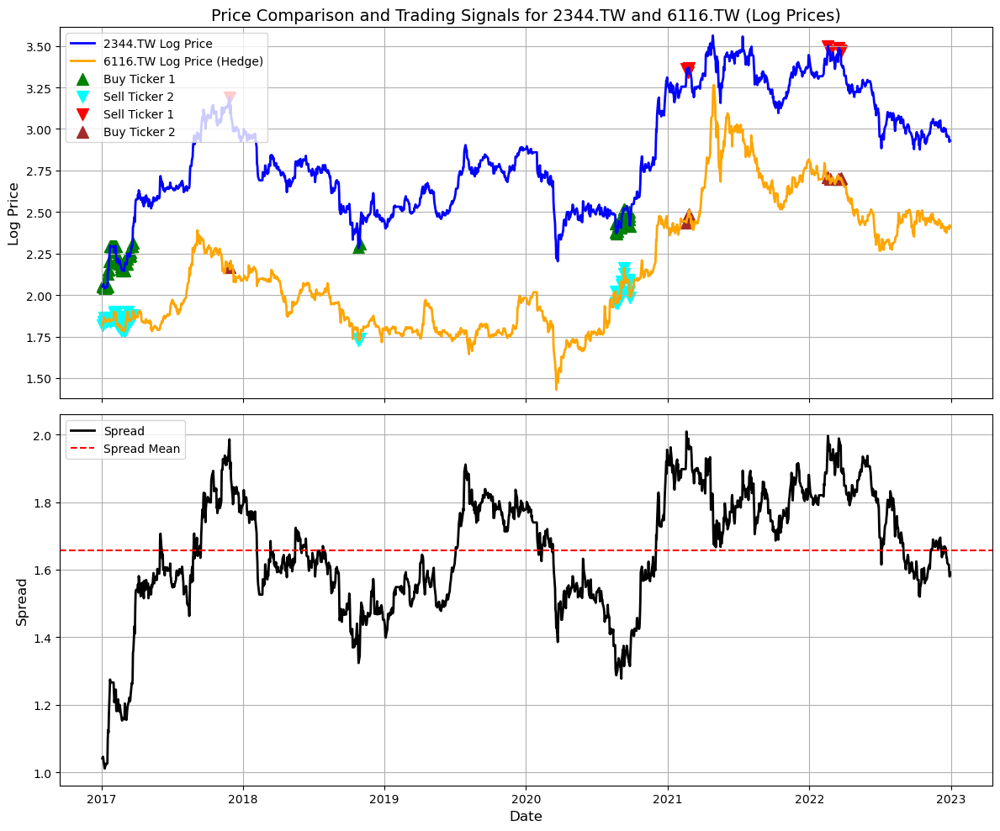

Results saved for 2344.TW and 6116.TW to 2344.TW_6116.TW_results.csv


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,61.739%
Cumulative returns,1846.9%
Annual volatility,98.668%
Sharpe ratio,0.96
Calmar ratio,0.83
Stability,0.79
Max drawdown,-74.048%


None

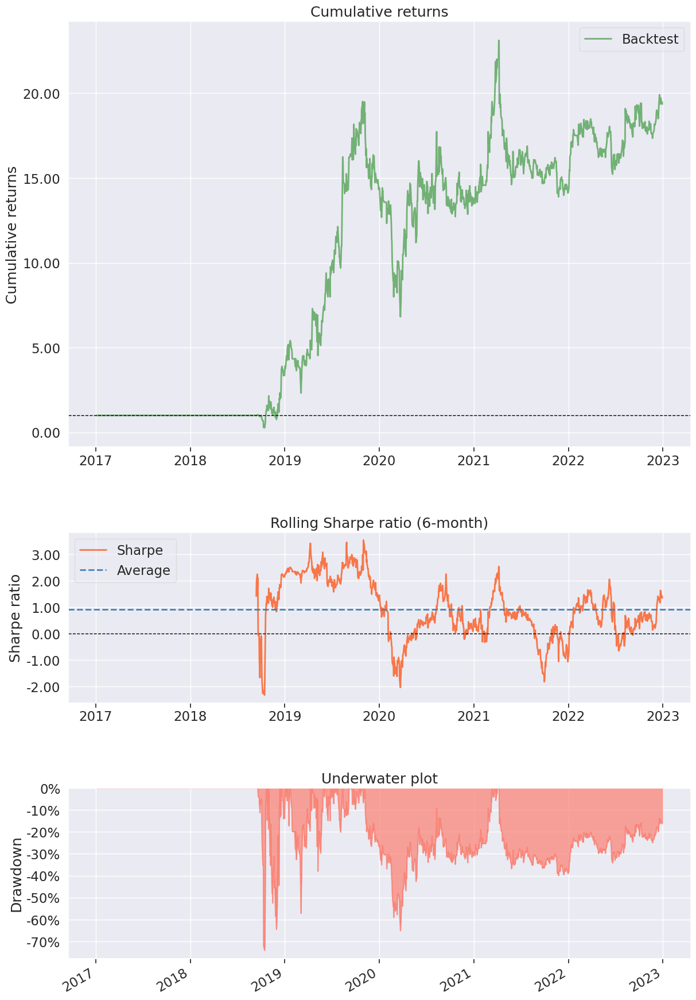

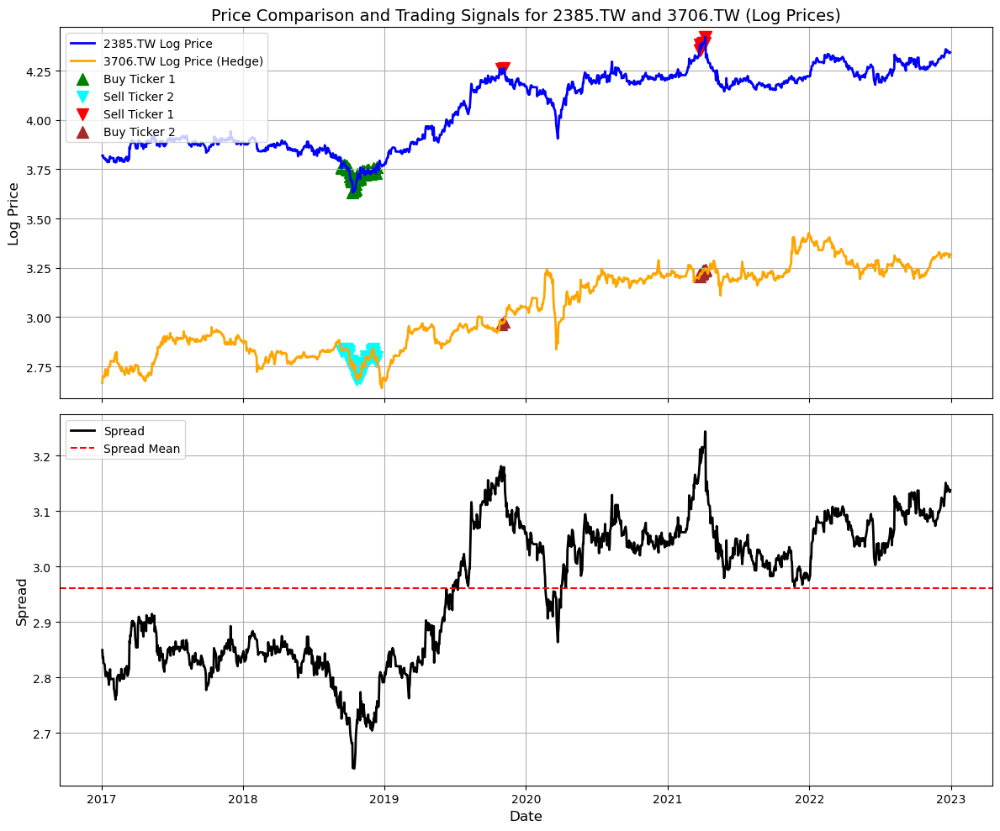

Results saved for 2385.TW and 3706.TW to 2385.TW_3706.TW_results.csv


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,110.234%
Cumulative returns,9730.281%
Annual volatility,188.539%
Sharpe ratio,1.02
Calmar ratio,1.26
Stability,0.91
Max drawdown,-87.258%


None

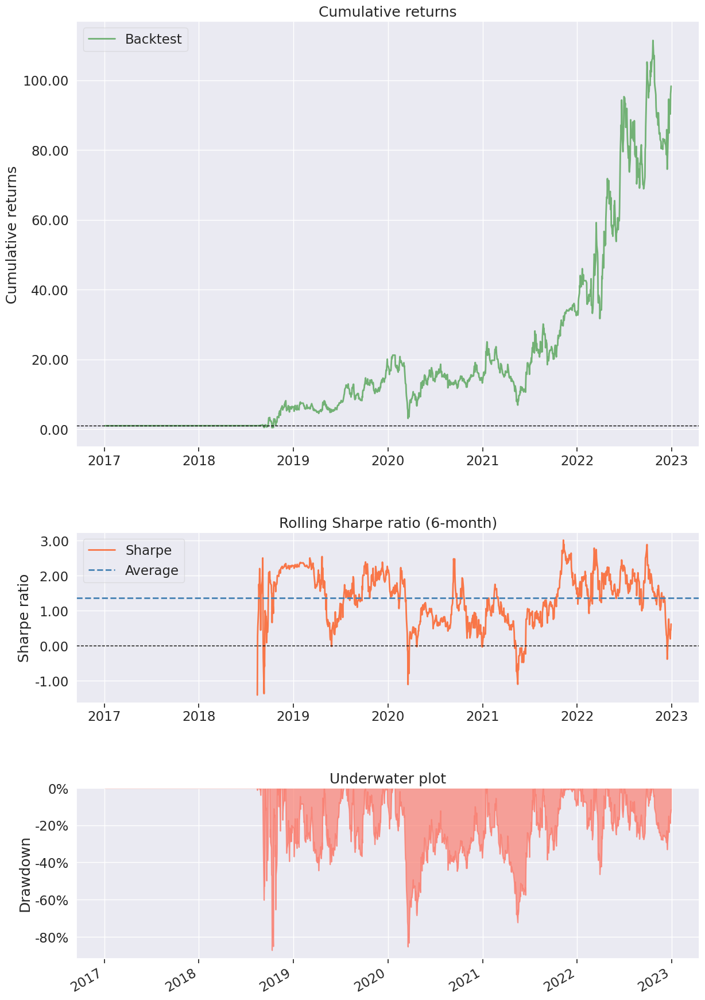

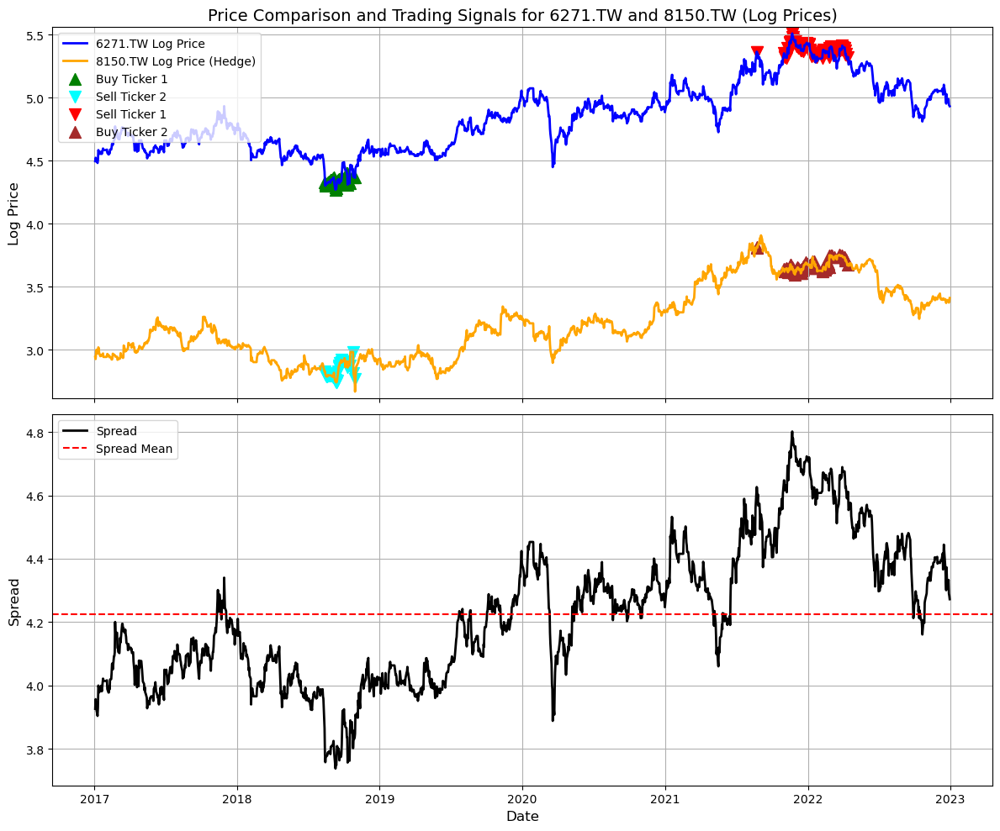

Results saved for 6271.TW and 8150.TW to 6271.TW_8150.TW_results.csv


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,54.334%
Cumulative returns,1357.727%
Annual volatility,95.11%
Sharpe ratio,0.89
Calmar ratio,0.70
Stability,0.82
Max drawdown,-77.353%


None

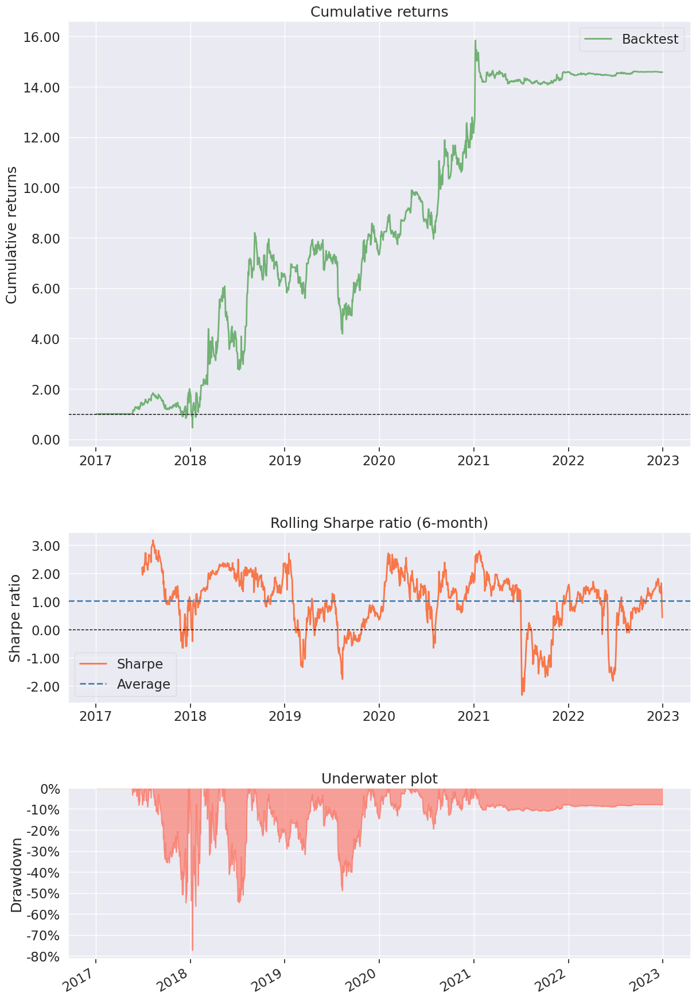

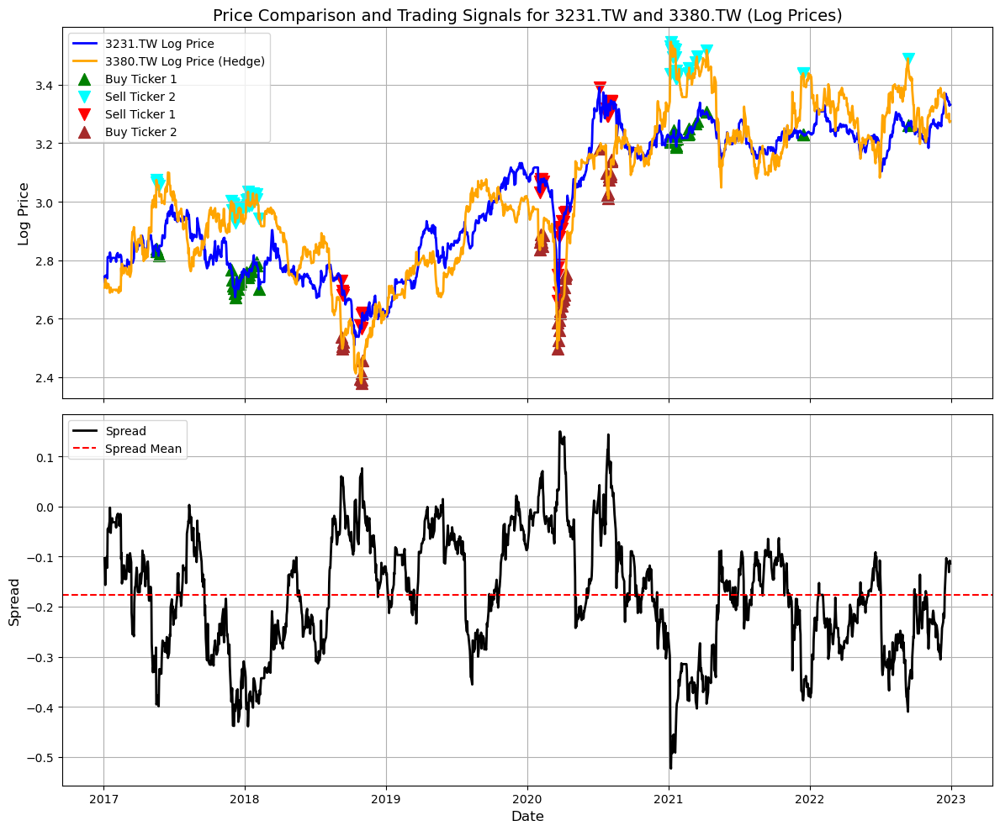

Results saved for 3231.TW and 3380.TW to 3231.TW_3380.TW_results.csv


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,95.728%
Cumulative returns,6221.819%
Annual volatility,136.651%
Sharpe ratio,1.11
Calmar ratio,1.07
Stability,0.89
Max drawdown,-89.443%


None

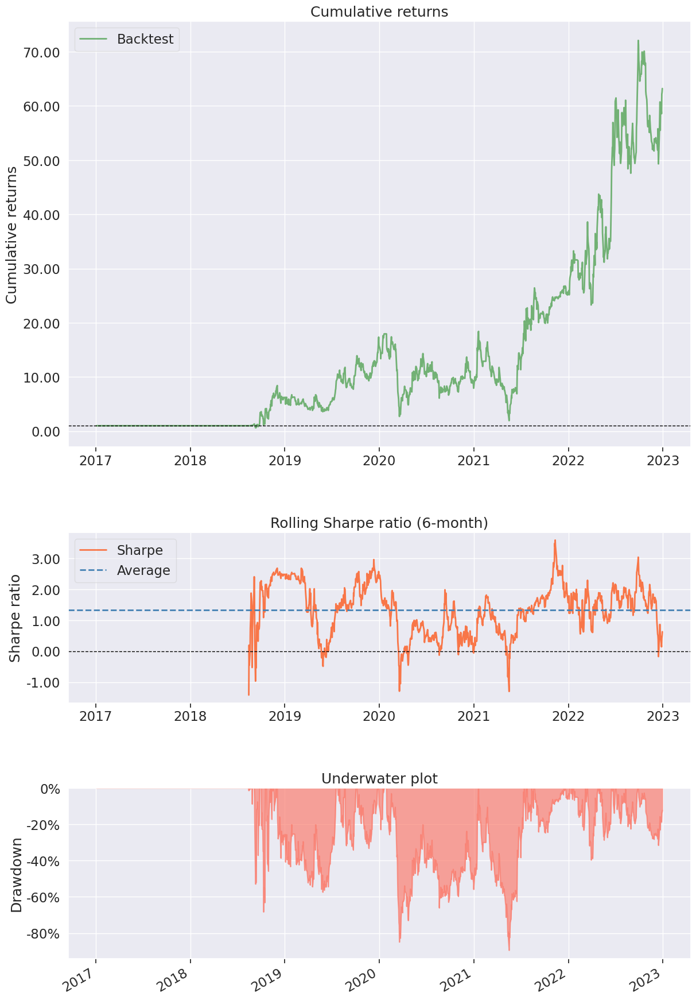

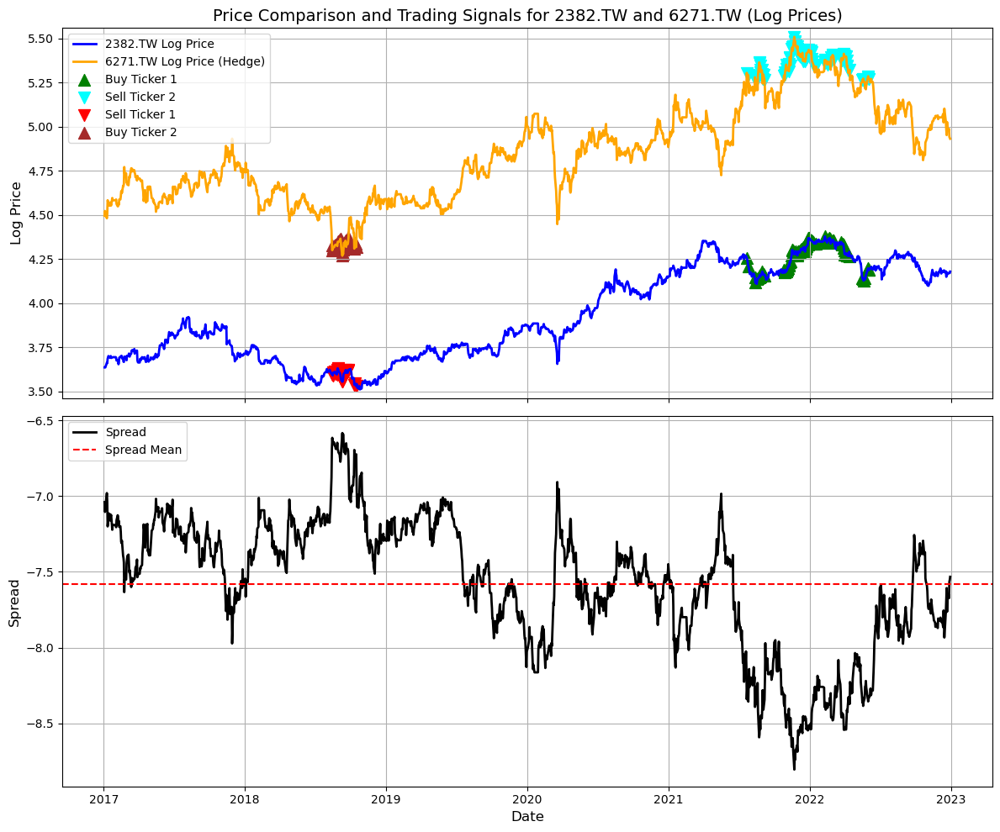

Results saved for 2382.TW and 6271.TW to 2382.TW_6271.TW_results.csv


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,57.007%
Cumulative returns,1520.779%
Annual volatility,69.34%
Sharpe ratio,0.98
Calmar ratio,0.93
Stability,0.84
Max drawdown,-61.284%


None

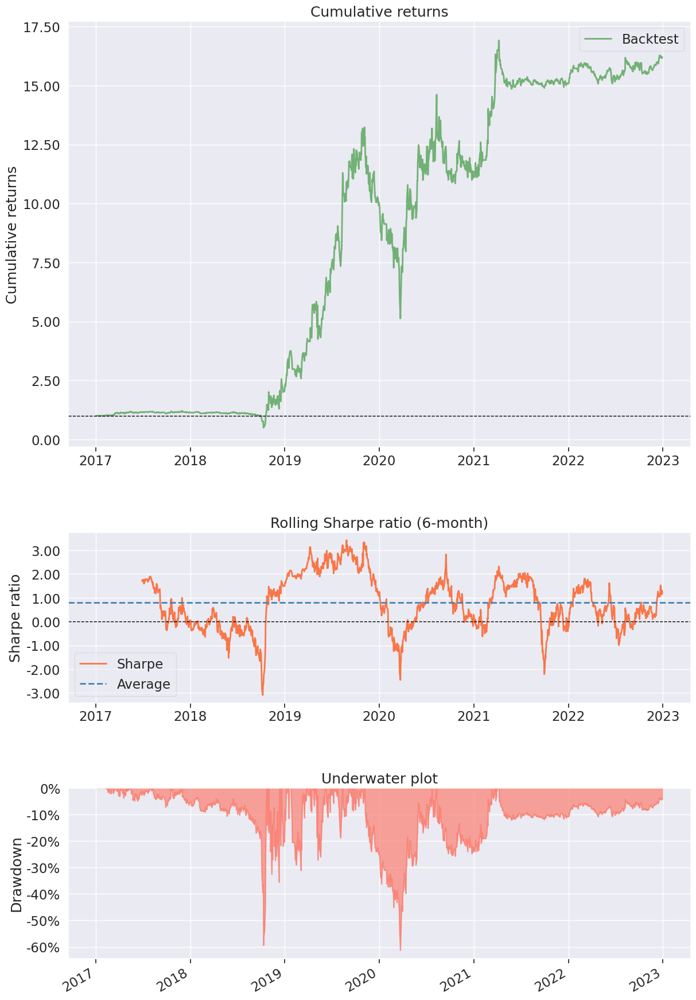

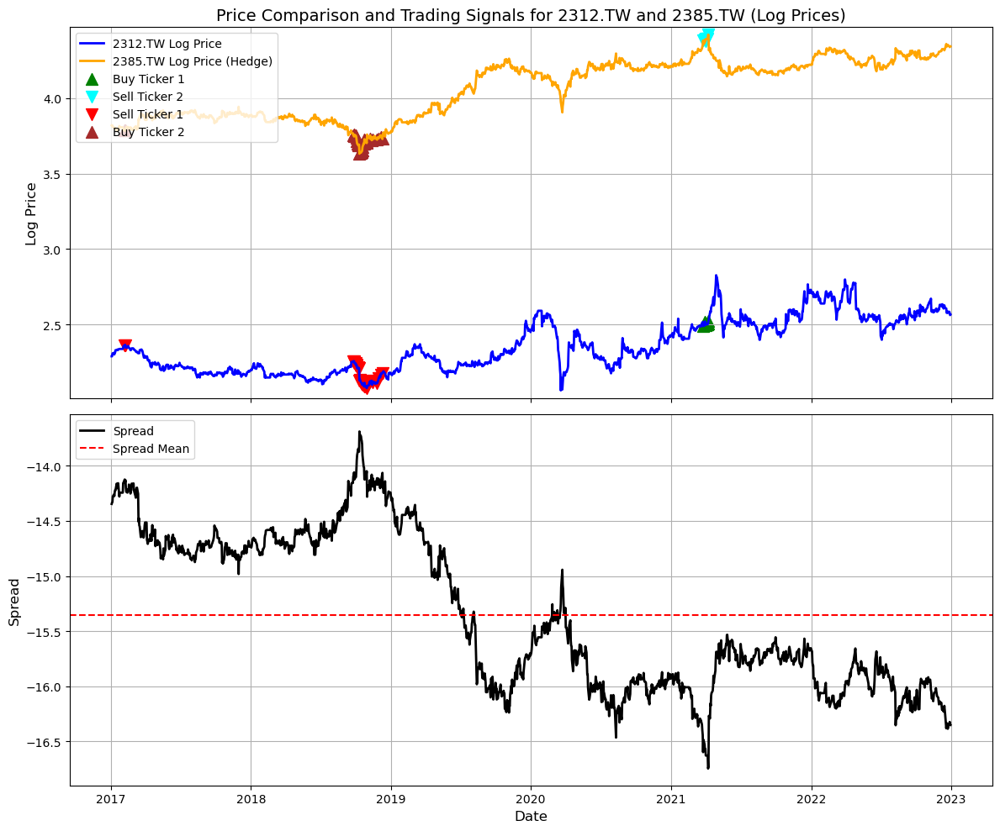

Results saved for 2312.TW and 2385.TW to 2312.TW_2385.TW_results.csv


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,97.866%
Cumulative returns,6660.412%
Annual volatility,188.144%
Sharpe ratio,1.20
Calmar ratio,1.08
Stability,0.55
Max drawdown,-90.336%


None

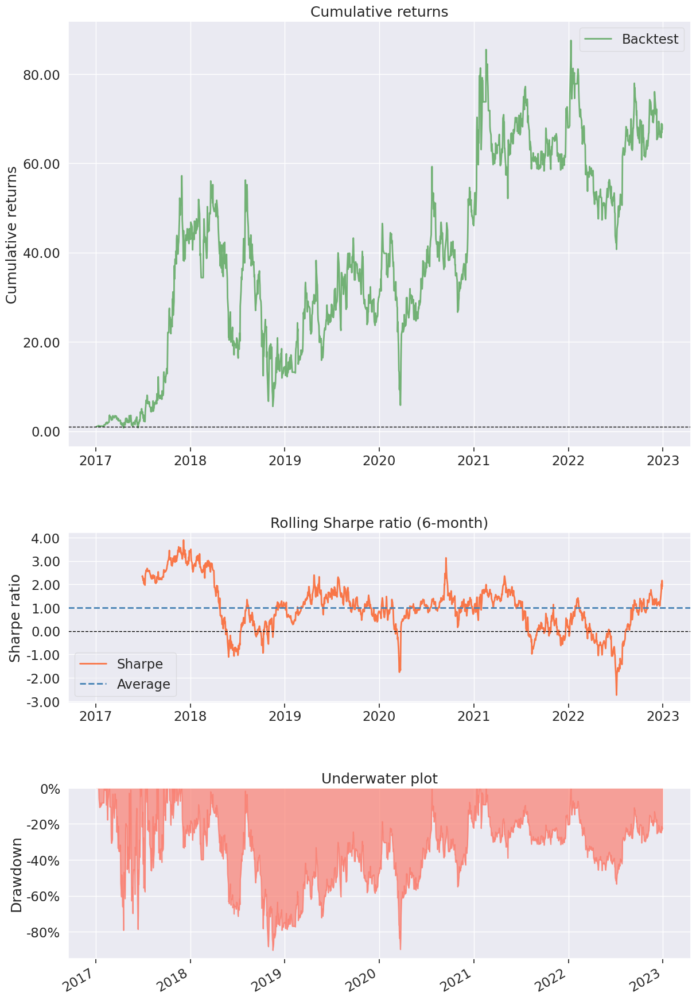

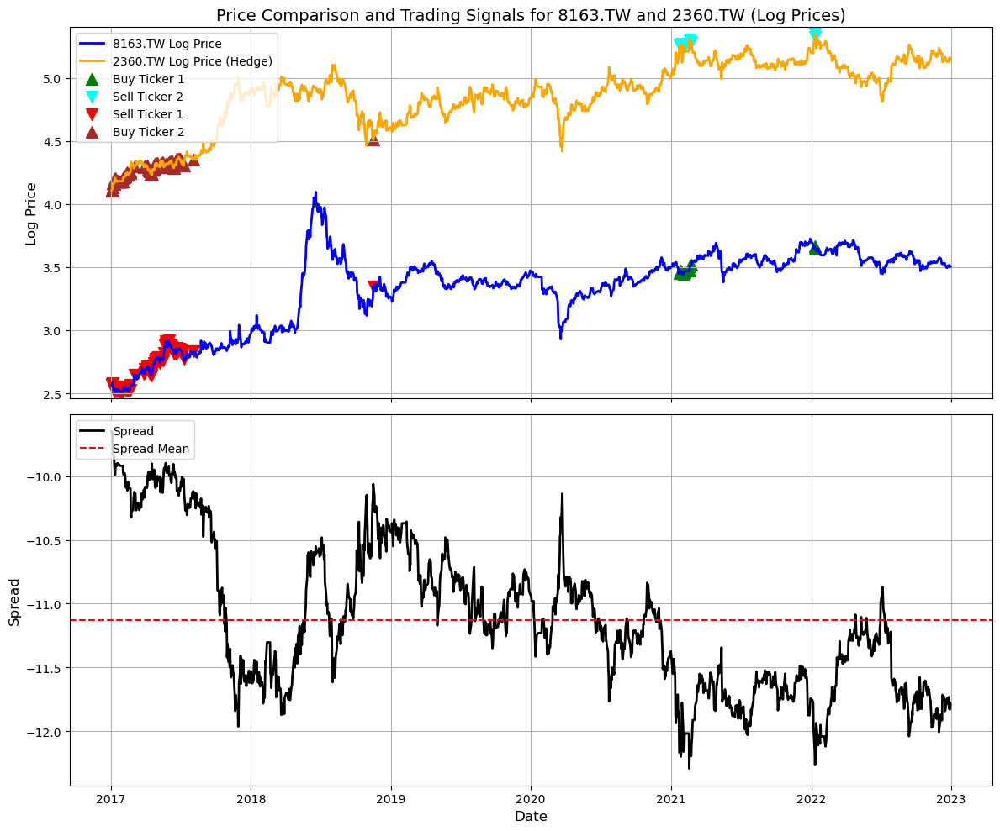

Results saved for 8163.TW and 2360.TW to 8163.TW_2360.TW_results.csv


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,77.62%
Cumulative returns,3371.476%
Annual volatility,63.285%
Sharpe ratio,1.21
Calmar ratio,1.38
Stability,0.37
Max drawdown,-56.304%


None

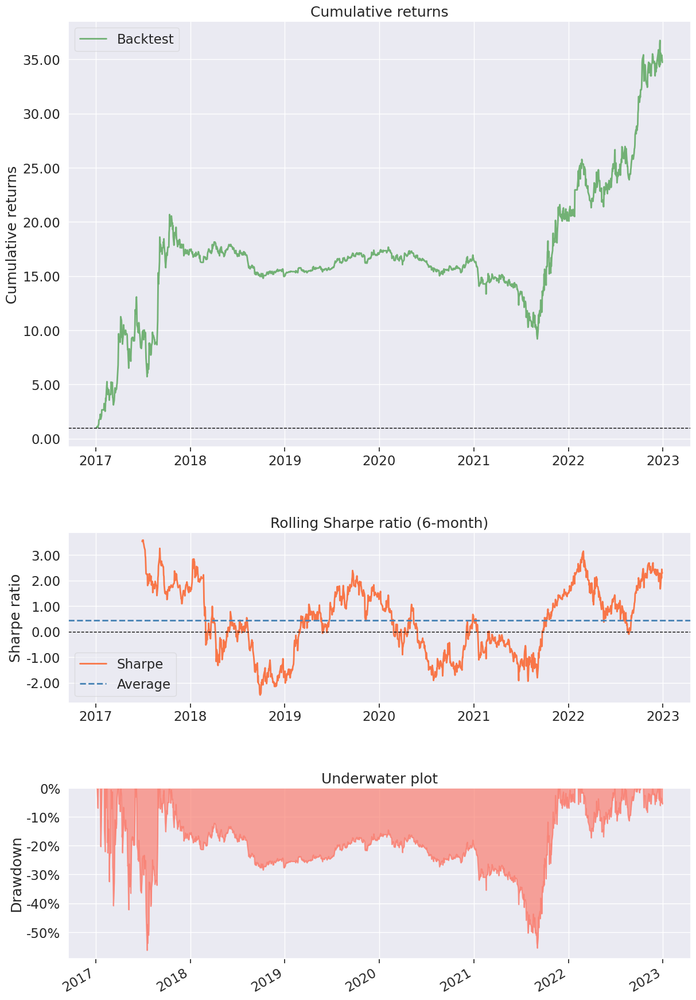

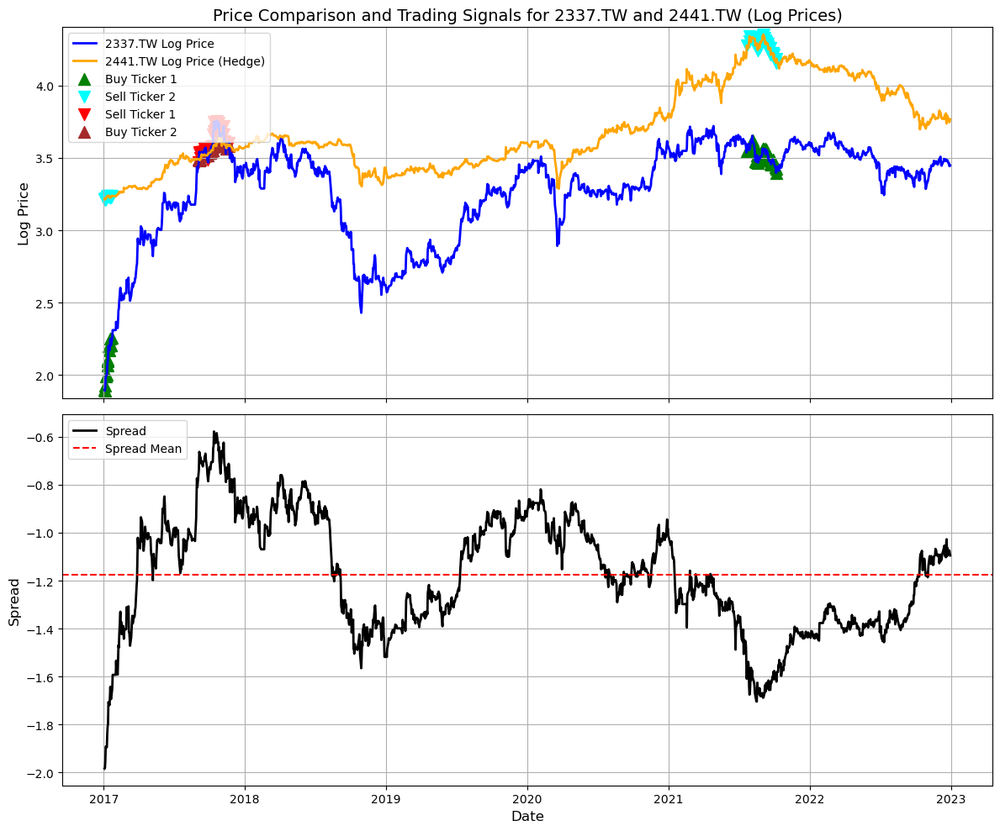

Results saved for 2337.TW and 2441.TW to 2337.TW_2441.TW_results.csv


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,74.813%
Cumulative returns,3046.328%
Annual volatility,75.555%
Sharpe ratio,1.11
Calmar ratio,1.14
Stability,0.67
Max drawdown,-65.702%


None

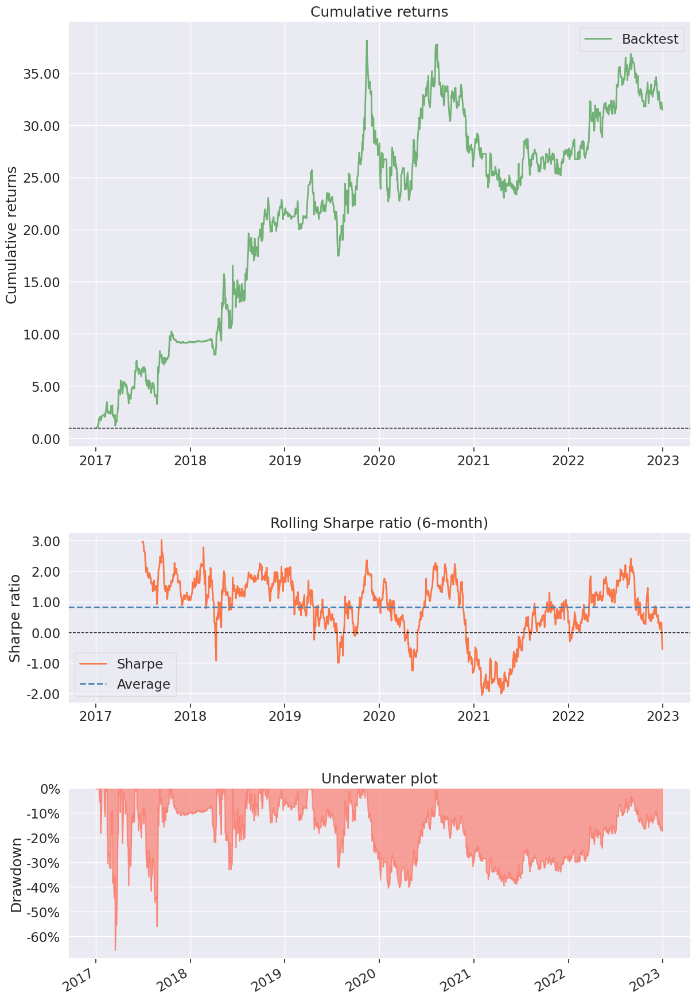

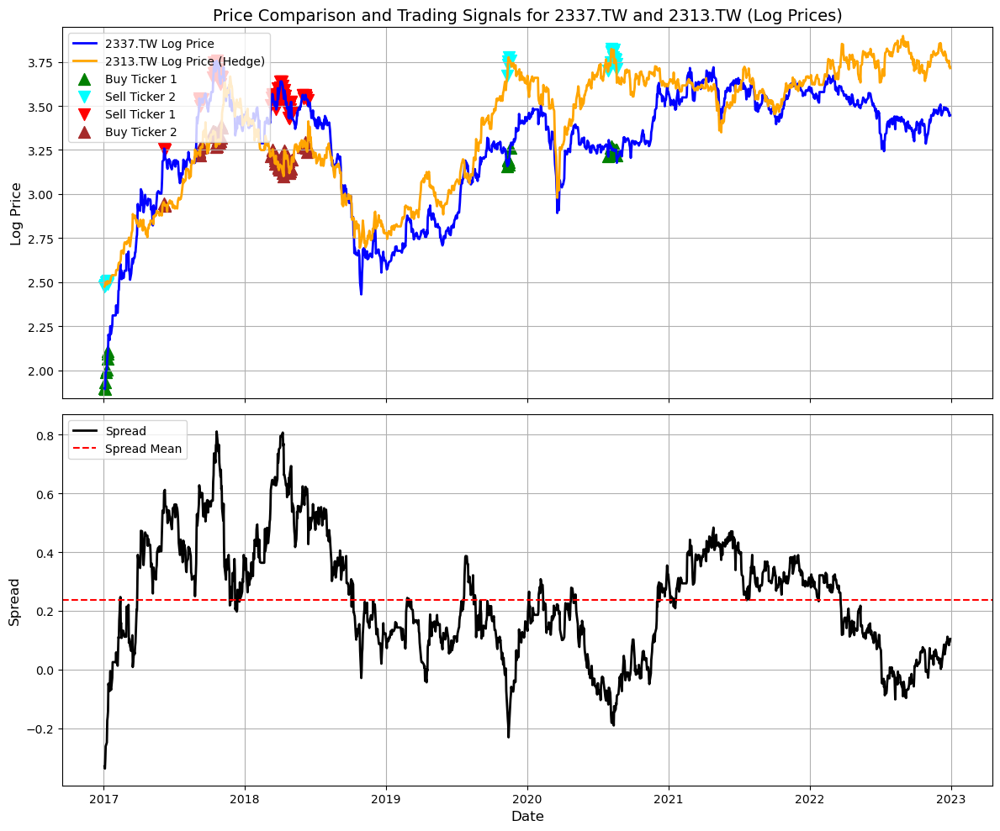

Results saved for 2337.TW and 2313.TW to 2337.TW_2313.TW_results.csv


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,84.377%
Cumulative returns,4271.517%
Annual volatility,758.268%
Sharpe ratio,-0.45
Calmar ratio,0.78
Stability,NaN
Max drawdown,-108.215%


None

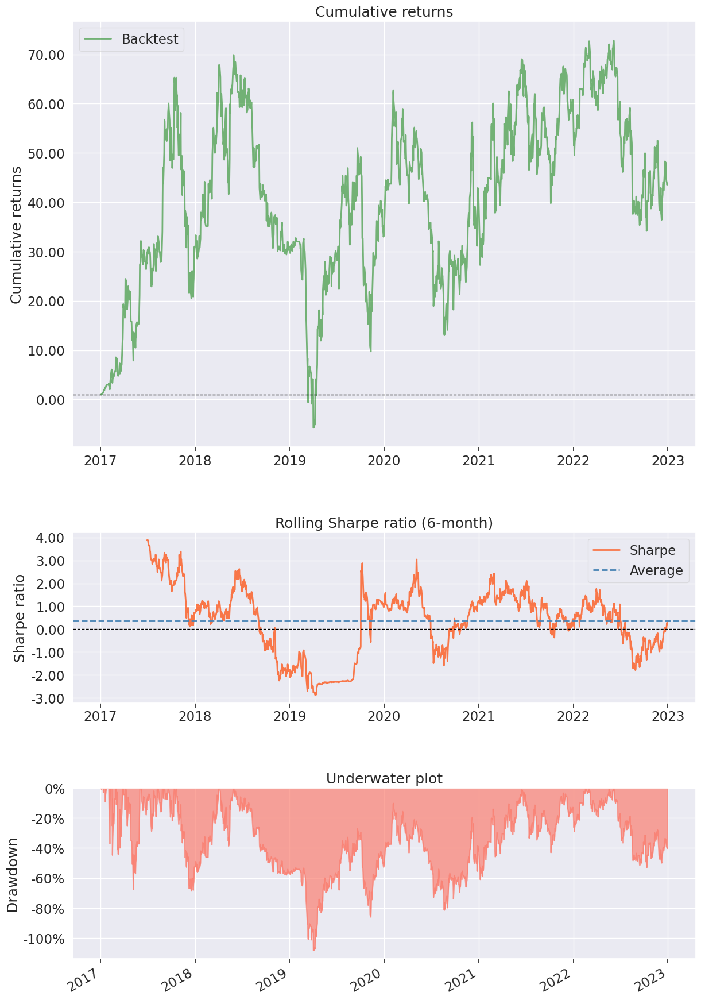

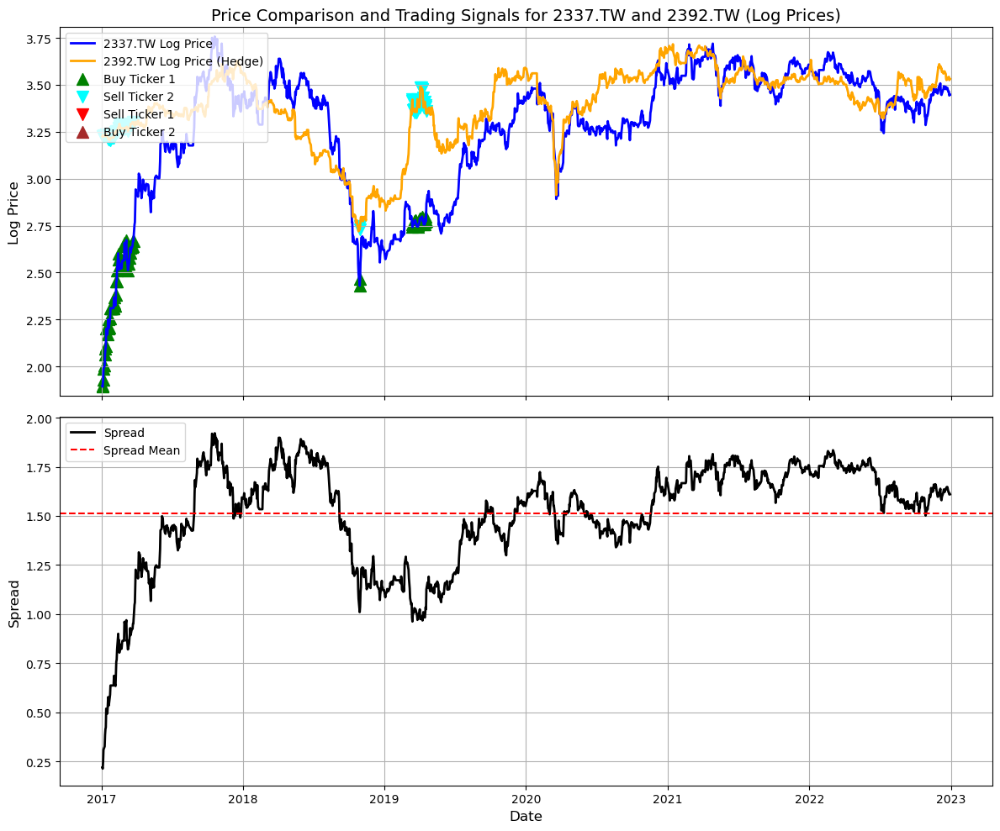

Results saved for 2337.TW and 2392.TW to 2337.TW_2392.TW_results.csv


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,nan%
Cumulative returns,-1240.113%
Annual volatility,2886.6%
Sharpe ratio,0.10
Calmar ratio,NaN
Stability,NaN
Max drawdown,-232.086%


None

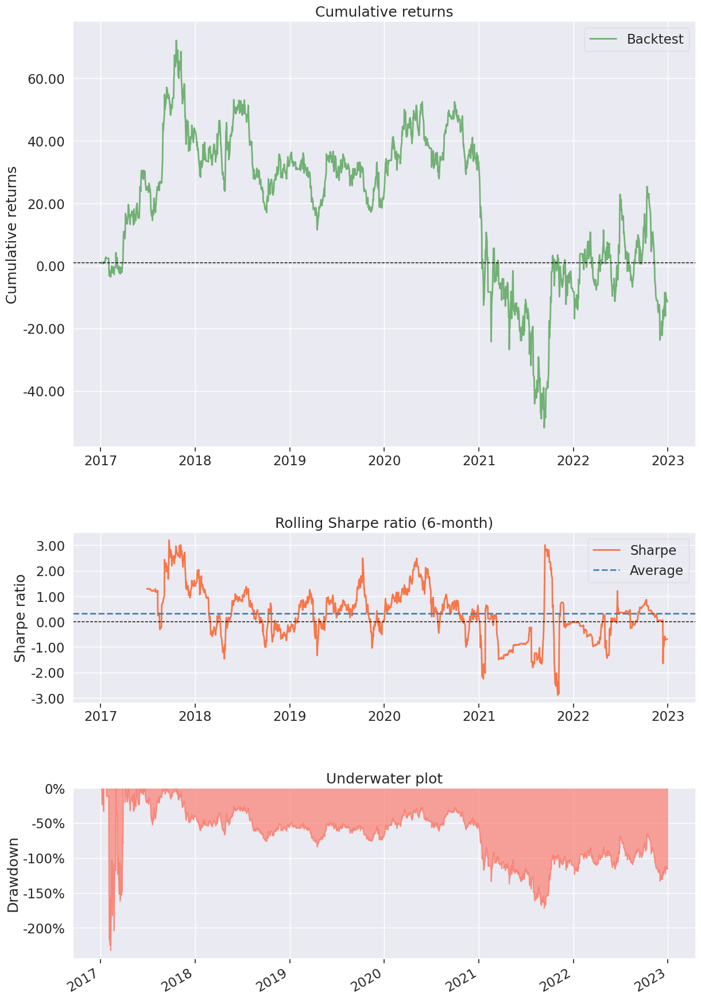

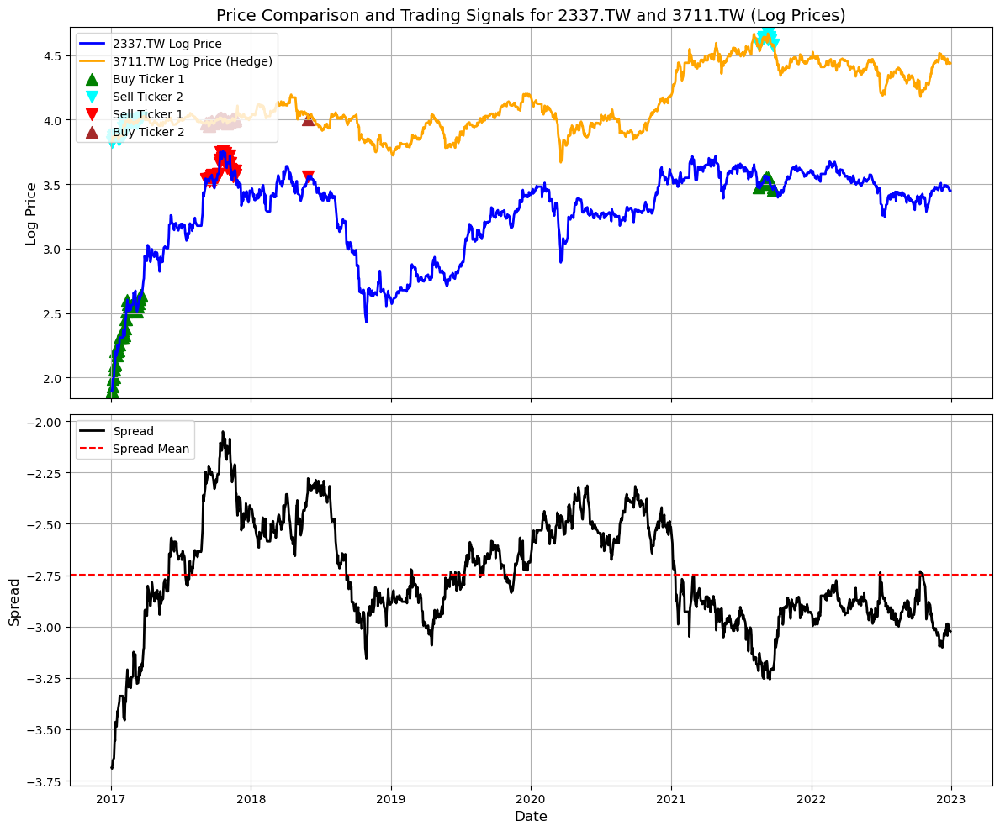

Results saved for 2337.TW and 3711.TW to 2337.TW_3711.TW_results.csv


In [51]:
for index, row in FPairs.iterrows():
    ticker1 = row[0]  
    ticker2 = row[1]

    # Running the backtest process for each pair
    price_df = Backtest.position(ticker1, ticker2)
    portfolio = Backtest.cashflow(price_df)  # Calculate cashflow
    performance = Backtest.metric(price_df)  # Calculate performance metrics
    display(performance)
    Backtest.signal_plot(price_df, HR)

    # Save the results to CSV dynamically based on ticker names
    filename = f"{ticker1}_{ticker2}_results.csv"
    
    # Saving the portfolio DataFrame to CSV
    portfolio.to_csv(filename)
    print(f"Results saved for {ticker1} and {ticker2} to {filename}")


#### **Preliminary Backtest's verdict**

Generally produce **good cumulative return**, **decent sharpe ratio** and **good tail ratio**. The main issue is the drawdown is huge mainly due to unrefined fixed position initiating approach. Whenever the spread threshold is reached, it initiates position limitlessly that lead to huge positions. When the spread widens, unrealized losses can be huge before spread reverts to mean. This might also be highly leveraged position.

#### Risk Management 
1. Adaptive Position Sizing (Volatility-Based) + Scaling Position with Z score 
2. Cap leverage and stop loss 

## Position Sizing & Stop Loss

### **Adaptive Sizing Based on Volatility and Spread Scaling with Z-score**

An initial 5,000,000 NTD funding for each potential pair. Previously, we initiated fixed position as long as spread is greater than 2 standard-devation from mean. Using standard deviation approach might be clear cut but when volatility kicks in might lead to unstable performance. Hence, our position size might need to vary with the spread volatilty. In addition, we our position size to base 5% of leverage fund (2:1). 

### **Z-Score Scaling for Position Sizing**
The Z-score is calculated as:
\[
Z_t = \frac{\text{Spread}_t - \mu}{\sigma}
\]

where:
- $( Z_t $) is the Z-score at time $(t)$,
- $\( \text{Spread}_t \)$ is the spread value at time $( t)$,
- $( \mu )$ is the mean of the spread (full history),
- $( \sigma )$ is the standard deviation of the spread.
#### **Position Sizing Based on Z-Score**
To scale position size dynamically based on the Z-score:
$[
\text{Position Size}_t = \text{Base Position} \times \min\left( 1 + k \times |Z_t|, \text{Max Scaling Factor} \right)
]$
where:
- $( k )$ is a scaling factor (determined by backtesting or risk management),
- $( \text{Max Scaling Factor} )$ caps the maximum position size to prevent excessive exposure.
If using a step function:
\[
\text{Position Size}_t =
\begin{cases}
1.0, & 2<|Z_t| < 2.5 \\
1.2, & 2.5 \leq |Z_t| < 3 \\
\end{cases}

### **Volatility-Based Position Multiplier for Spread Trading**
The idea of volatility adaptive sizing is to dynamically adjust position based on rolling standard deviation of the mean. The objective is to normalize risk exposure by taking larger position when volatility is low and smaller position when volatility is high.

The **position multiplier** is defined as:
$[
\text{Position Multiplier}_t = \frac{\sigma_{\text{mean}}}{\sigma_t}
]$
where:
- $\sigma_{\text{mean}}$ is the desired (normalized) volatility level for the strategy.
- $\sigma_t$ is the realized or rolling standard deviation of the spread at time $t$.
Thus, the **position size** is adjusted dynamically using:
$[
\text{Position Size}_t = \text{Base Position} \times \frac{\sigma_{\text{target}}}{\sigma_t}
]$
#### **Rolling Volatility Estimation**
The realized volatility $( \sigma_t)$ is computed using a rolling window $N$:
$\sigma_t = \sqrt{\frac{1}{N} \sum_{i=t-N}^{t} (S_i - \bar{S})^2}$
where:
- $S_i$ is the spread value at time $i$.
- $( \bar{S} )$ is the mean.
#### **Cap for total position**
$2<|Z_t| < 2.5 - text{lesser than 85% of leveraged fund}$
$2.5<|Z_t| < 3: - text{lesser than 15% of leveraged fund}$

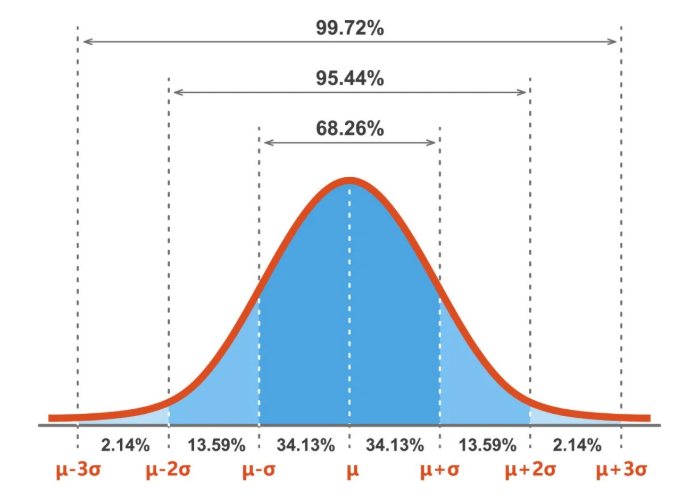

In [57]:
Image(filename="./Z-Score_Distribution.PNG")

## Backtest with SL and Position Sizing

In [117]:
from Backtest_SL_Dynamic import Strategy
Strategy =  Strategy(FPairs,merged_df,HR)

,2344.TW,Spread,Signal,Volatility Mutiplier,K,6116.TW,2344.TW's trade,6116.TW's trade,2344.TW's position,6116.TW's position,Cash,Leverage,Number of trades,Status,Portfolio's Value
Date,,,,,,,,,,,,,,,
2017-01-03,7.772441,-3.464082,Buy,NaN,1.2,6.160337,43064.0,-43064.0,43064.0,-43064.0,4.930576e+06,0.108488,1.0,Initiated,5.000000e+06
2017-01-04,7.811111,-3.443989,Buy,NaN,1.2,6.175815,39728.0,-39728.0,82792.0,-82792.0,4.865609e+06,0.192244,2.0,Initiated,5.000999e+06
2017-01-05,7.888449,-3.439024,Buy,NaN,1.2,6.276424,36315.0,-36315.0,119107.0,-119107.0,4.807069e+06,0.259791,3.0,Initiated,4.999072e+06
2017-01-06,7.811111,-3.494477,Buy,NaN,1.2,6.276424,33762.0,-33762.0,152869.0,-152869.0,4.755255e+06,0.311711,4.0,Initiated,4.989861e+06
2017-01-09,7.733775,-3.634106,Buy,NaN,1.2,6.446685,31129.0,-31129.0,183998.0,-183998.0,4.715189e+06,0.356232,5.0,Initiated,4.952011e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,19.122204,-0.236704,NaN,8.412515,0.0,11.100000,0.0,0.0,0.0,0.0,8.255210e+06,1.000000,63.0,Closed,8.255210e+06
2022-12-27,19.170010,-0.236693,NaN,7.693626,0.0,11.150000,0.0,0.0,0.0,0.0,8.255210e+06,1.000000,63.0,Closed,8.255210e+06
2022-12-28,18.596344,-0.365378,NaN,6.584824,0.0,11.000000,0.0,0.0,0.0,0.0,8.255210e+06,1.000000,63.0,Closed,8.255210e+06


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,8.459%
Cumulative returns,65.104%
Annual volatility,8.128%
Sharpe ratio,1.04
Calmar ratio,0.94
Stability,0.43
Max drawdown,-8.991%


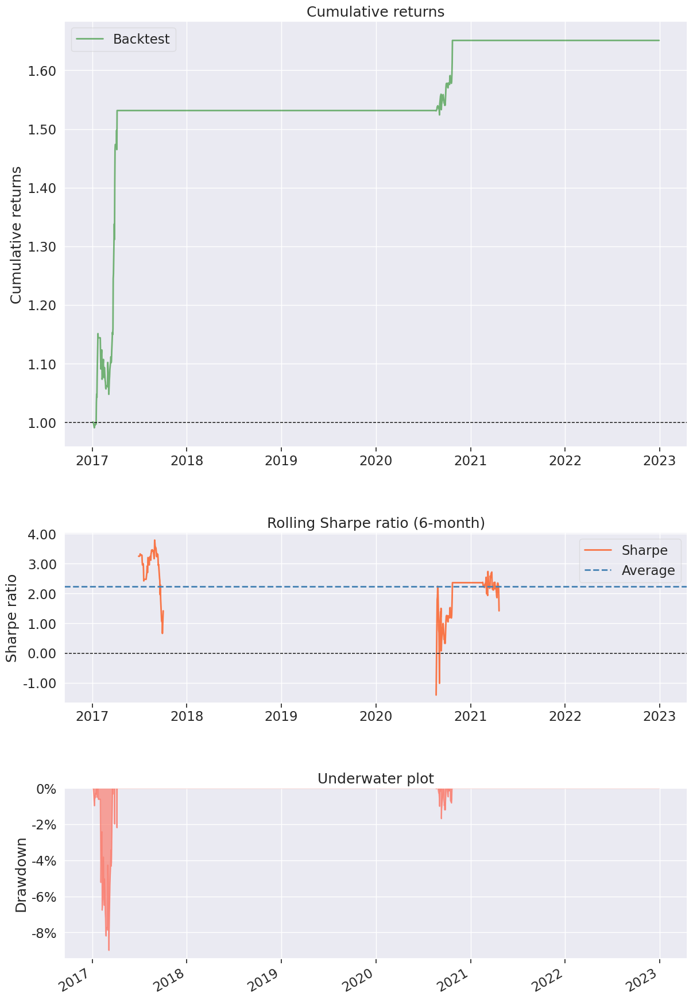

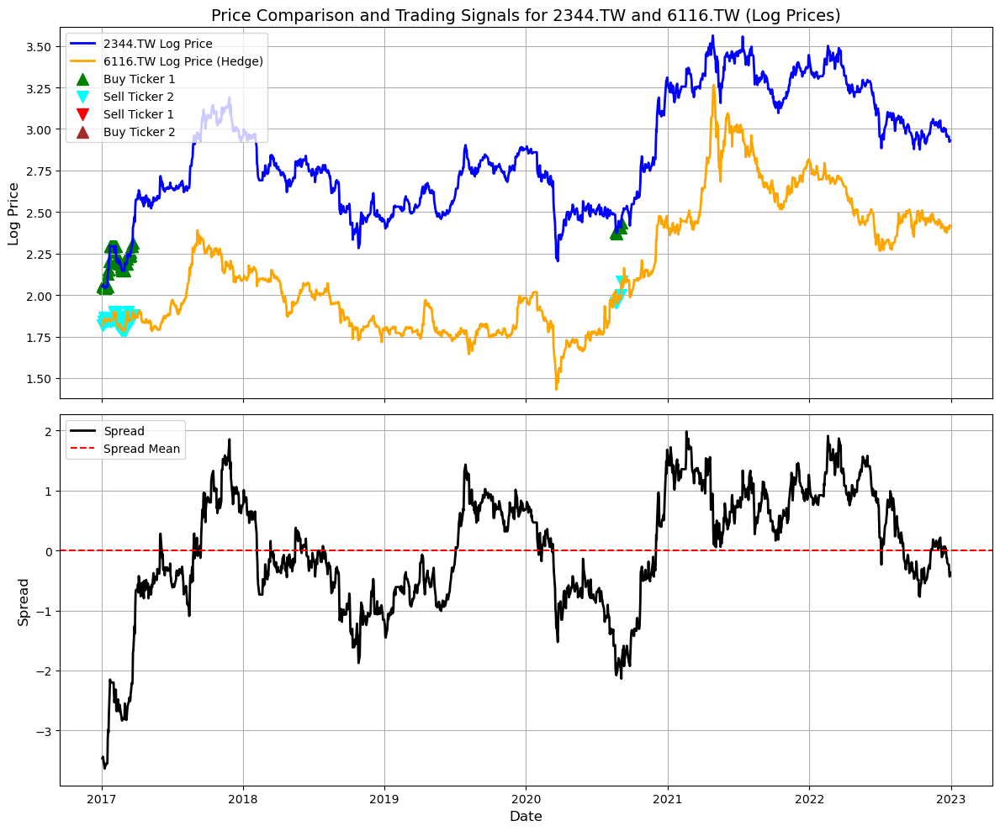

Results saved for 2344.TW and 6116.TW to 2344.TW_6116.TW_results.csv


,2385.TW,Spread,Signal,Volatility Mutiplier,K,3706.TW,2385.TW's trade,3706.TW's trade,2385.TW's position,3706.TW's position,Cash,Leverage,Number of trades,Status,Portfolio's Value
Date,,,,,,,,,,,,,,,
2017-01-03,45.554295,-0.906003,NaN,NaN,0.0,14.396782,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-04,45.432167,-1.021354,NaN,NaN,0.0,14.863448,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-05,45.554295,-1.004275,NaN,NaN,0.0,14.886786,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-06,45.065781,-1.091367,NaN,NaN,0.0,14.886786,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-09,44.882587,-1.115050,NaN,NaN,0.0,14.840117,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,77.092010,1.437452,NaN,7.142623,0.0,27.555494,0.0,0.0,0.0,0.0,5.823184e+06,1.0,18.0,Closed,5.823184e+06
2022-12-27,77.002884,1.423144,NaN,7.424764,0.0,27.602123,0.0,0.0,0.0,0.0,5.823184e+06,1.0,18.0,Closed,5.823184e+06
2022-12-28,76.557266,1.421243,NaN,7.710853,0.0,27.182493,0.0,0.0,0.0,0.0,5.823184e+06,1.0,18.0,Closed,5.823184e+06


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,2.499%
Cumulative returns,16.464%
Annual volatility,3.798%
Sharpe ratio,0.67
Calmar ratio,0.41
Stability,0.72
Max drawdown,-6.138%


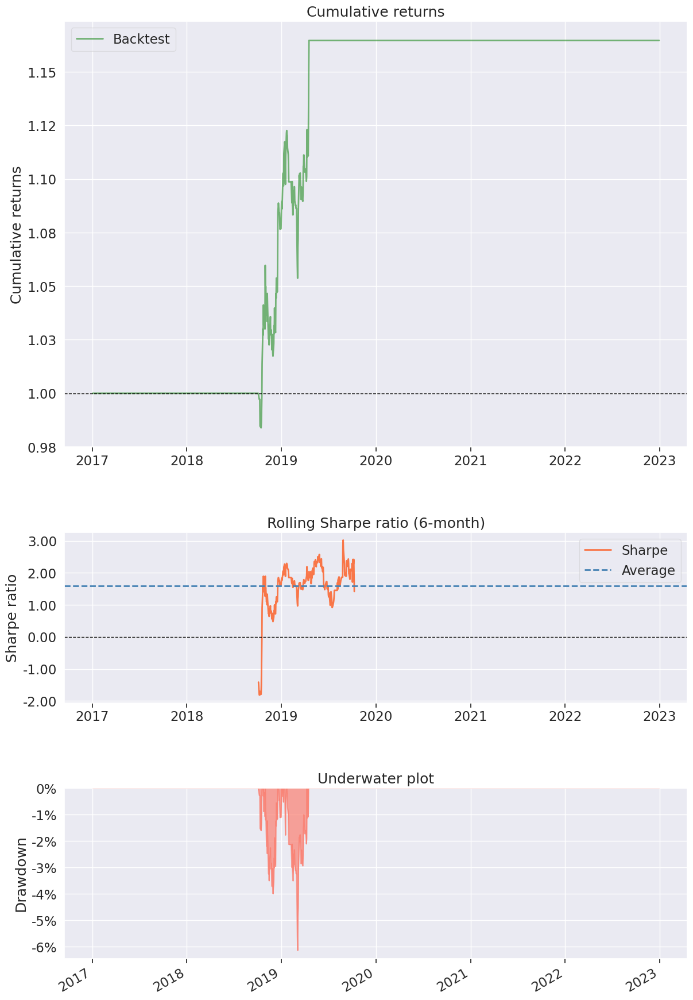

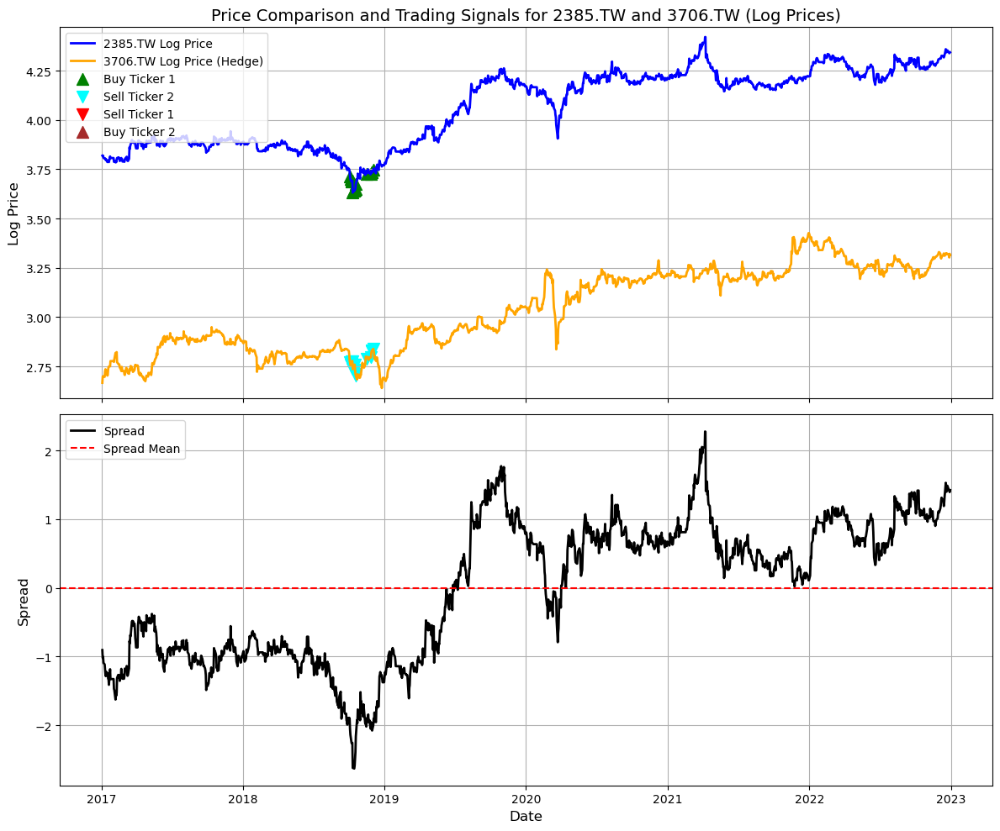

Results saved for 2385.TW and 3706.TW to 2385.TW_3706.TW_results.csv


,6271.TW,Spread,Signal,Volatility Mutiplier,K,8150.TW,6271.TW's trade,8150.TW's trade,6271.TW's position,8150.TW's position,Cash,Leverage,Number of trades,Status,Portfolio's Value
Date,,,,,,,,,,,,,,,
2017-01-03,89.559746,-1.353741,NaN,NaN,0.0,18.956896,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-04,92.036057,-1.215344,NaN,NaN,0.0,18.649900,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-05,90.385178,-1.327882,NaN,NaN,0.0,19.302265,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-06,90.385178,-1.362150,NaN,NaN,0.0,20.069750,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-09,88.321587,-1.455350,NaN,NaN,0.0,19.801128,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,145.065048,0.443242,NaN,6.079693,0.0,29.764128,0.0,0.0,0.0,0.0,6.393468e+06,1.0,20.0,Closed,6.393468e+06
2022-12-27,146.515701,0.496536,NaN,5.848376,0.0,29.493134,0.0,0.0,0.0,0.0,6.393468e+06,1.0,20.0,Closed,6.393468e+06
2022-12-28,139.987778,0.298715,NaN,5.205947,0.0,29.176973,0.0,0.0,0.0,0.0,6.393468e+06,1.0,20.0,Closed,6.393468e+06


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,4.062%
Cumulative returns,27.869%
Annual volatility,9.233%
Sharpe ratio,0.48
Calmar ratio,0.41
Stability,0.75
Max drawdown,-9.925%


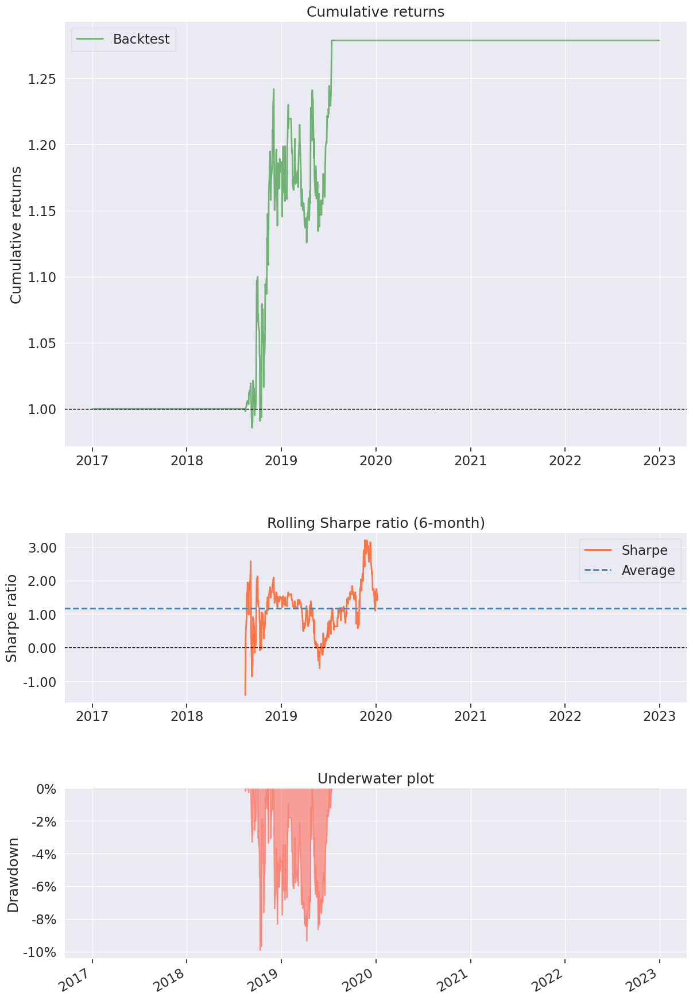

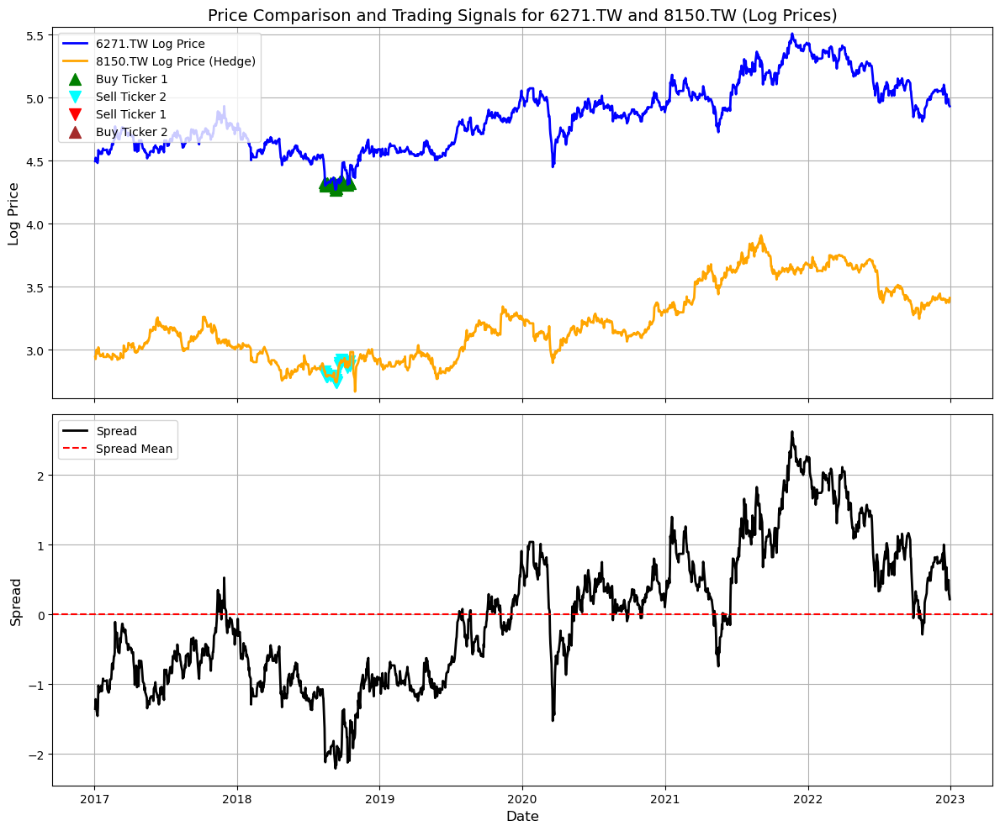

Results saved for 6271.TW and 8150.TW to 6271.TW_8150.TW_results.csv


,3231.TW,Spread,Signal,Volatility Mutiplier,K,3380.TW,3231.TW's trade,3380.TW's trade,3231.TW's position,3380.TW's position,Cash,Leverage,Number of trades,Status,Portfolio's Value
Date,,,,,,,,,,,,,,,
2017-01-03,15.547923,0.616989,NaN,NaN,0.0,14.974222,0.0,0.0,0.0,0.0,5.000000e+06,1.000000,0.0,Closed,5.000000e+06
2017-01-04,15.392446,0.442715,NaN,NaN,0.0,15.123964,0.0,0.0,0.0,0.0,5.000000e+06,1.000000,0.0,Closed,5.000000e+06
2017-01-05,15.205872,0.163918,NaN,NaN,0.0,15.423450,0.0,0.0,0.0,0.0,5.000000e+06,1.000000,0.0,Closed,5.000000e+06
2017-01-06,15.610117,0.430245,NaN,NaN,0.0,15.348577,0.0,0.0,0.0,0.0,5.000000e+06,1.000000,0.0,Closed,5.000000e+06
2017-01-09,15.547923,0.639357,NaN,NaN,0.0,14.936787,0.0,0.0,0.0,0.0,5.000000e+06,1.000000,0.0,Closed,5.000000e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,28.232948,0.522406,NaN,1.578436,0.0,26.680269,0.0,0.0,-186550.0,186550.0,6.251316e+06,1.638705,45.0,Initiated,5.961664e+06
2022-12-27,28.280560,0.381034,NaN,1.579563,0.0,27.149168,0.0,0.0,-186550.0,186550.0,6.251316e+06,1.654118,45.0,Initiated,6.040255e+06
2022-12-28,27.899673,0.516279,NaN,1.566581,0.0,26.398932,0.0,0.0,-186550.0,186550.0,6.251316e+06,1.620364,45.0,Initiated,5.971352e+06


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,2.892%
Cumulative returns,19.247%
Annual volatility,20.793%
Sharpe ratio,0.24
Calmar ratio,0.10
Stability,0.74
Max drawdown,-28.51%


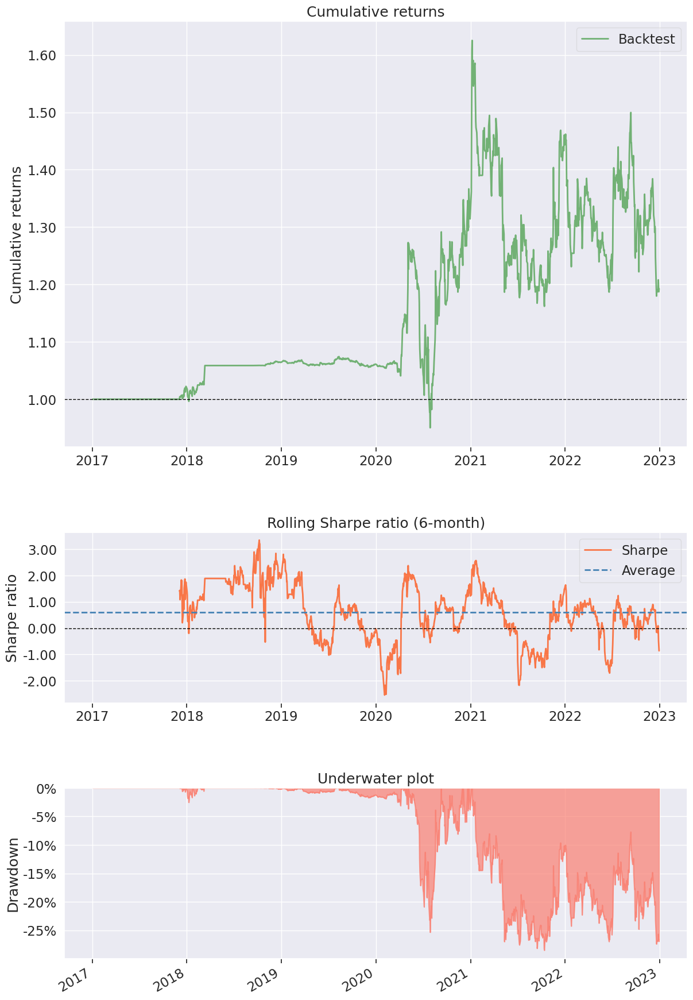

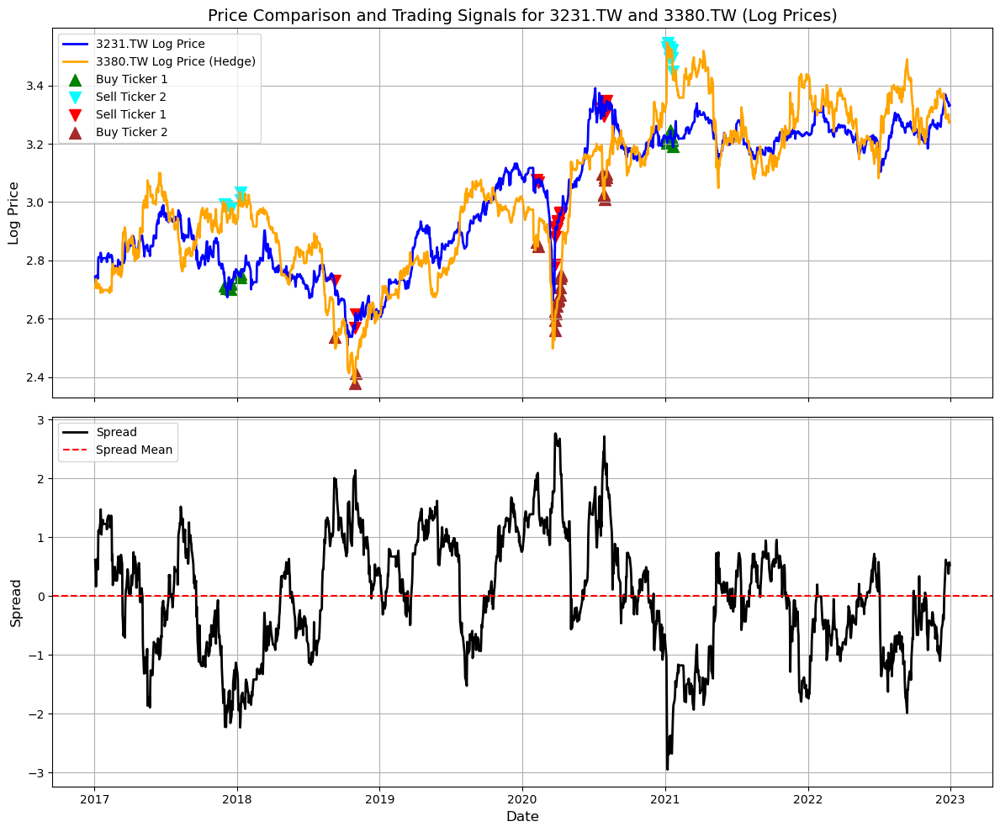

Results saved for 3231.TW and 3380.TW to 3231.TW_3380.TW_results.csv


,2382.TW,Spread,Signal,Volatility Mutiplier,K,6271.TW,2382.TW's trade,6271.TW's trade,2382.TW's position,6271.TW's position,Cash,Leverage,Number of trades,Status,Portfolio's Value
Date,,,,,,,,,,,,,,,
2017-01-03,37.951729,1.254769,NaN,NaN,0.0,89.559746,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-04,37.951729,1.104132,NaN,NaN,0.0,92.036057,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-05,37.951729,1.204099,NaN,NaN,0.0,90.385178,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-06,38.204739,1.219551,NaN,NaN,0.0,90.385178,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
2017-01-09,38.963776,1.392857,NaN,NaN,0.0,88.321587,0.0,0.0,0.0,0.0,5.000000e+06,1.0,0.0,Closed,5.000000e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,64.766739,-0.165973,NaN,5.203122,0.0,145.065048,0.0,0.0,-7271824.0,7271824.0,-1.053938e+09,1.0,94.0,Initiated,-4.700232e+08
2022-12-27,64.766739,-0.220929,NaN,4.976974,0.0,146.515701,0.0,0.0,-7271824.0,7271824.0,-1.053938e+09,1.0,94.0,Initiated,-4.594743e+08
2022-12-28,64.857071,0.034038,NaN,4.358653,0.0,139.987778,0.0,0.0,-7271824.0,7271824.0,-1.053938e+09,1.0,94.0,Initiated,-5.076011e+08


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,nan%
Cumulative returns,-10528.686%
Annual volatility,797.792%
Sharpe ratio,0.34
Calmar ratio,NaN
Stability,NaN
Max drawdown,-2447.005%


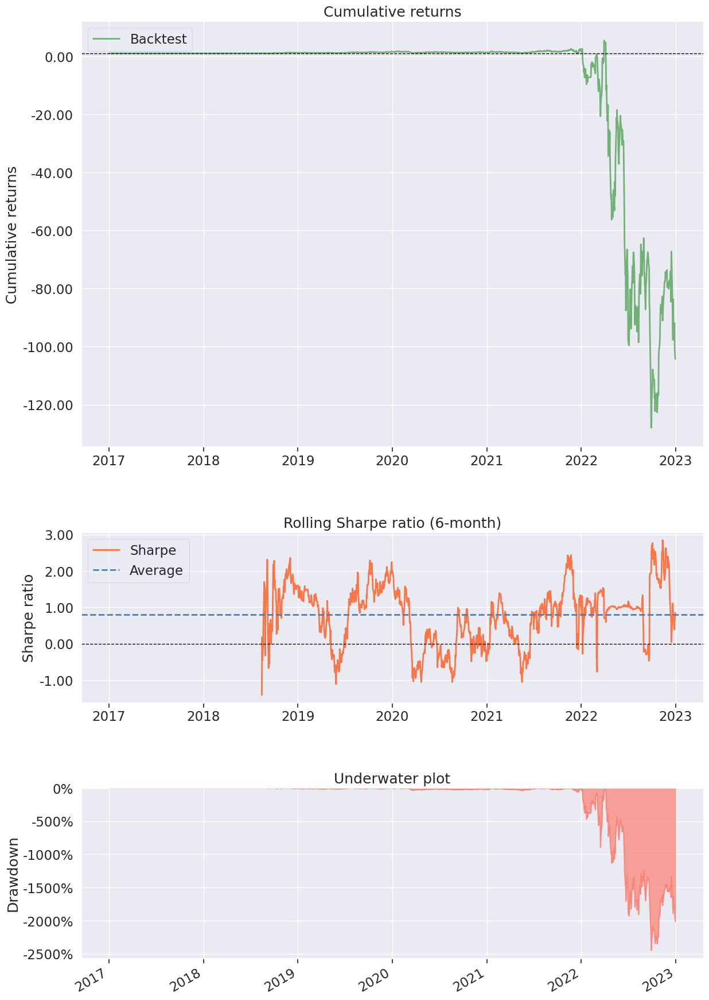

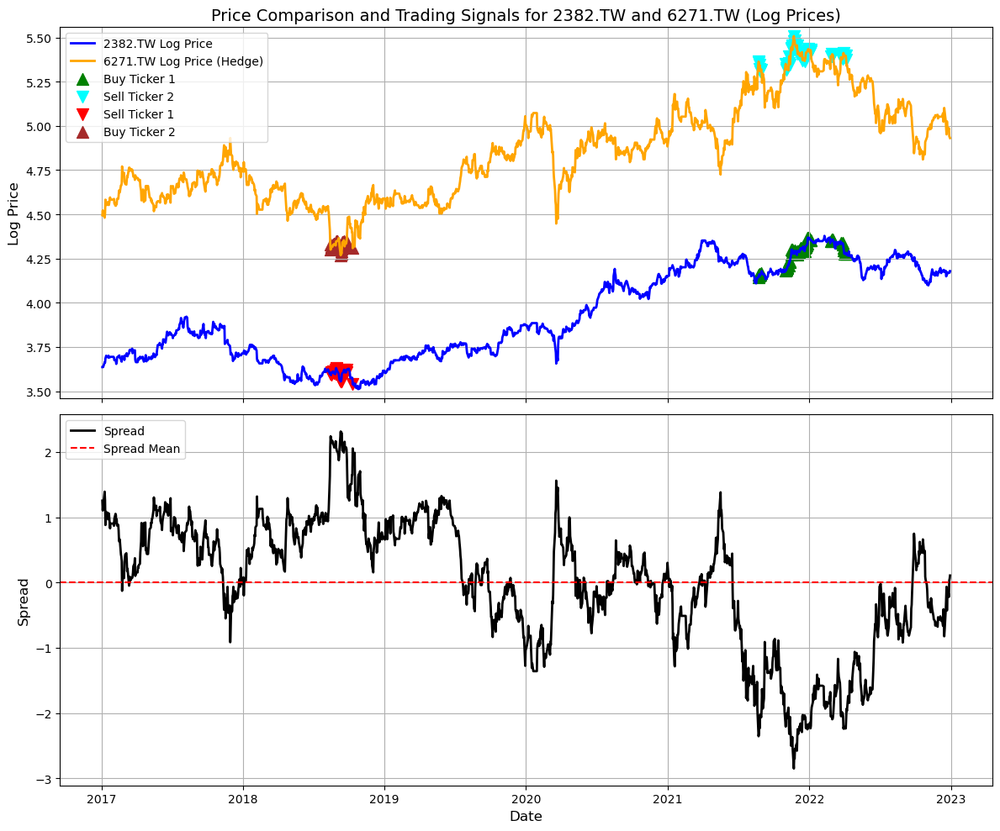

Results saved for 2382.TW and 6271.TW to 2382.TW_6271.TW_results.csv


,2312.TW,Spread,Signal,Volatility Mutiplier,K,2385.TW,2312.TW's trade,2385.TW's trade,2312.TW's position,2385.TW's position,Cash,Leverage,Number of trades,Status,Portfolio's Value
Date,,,,,,,,,,,,,,,
2017-01-03,9.861103,1.445572,NaN,NaN,0.0,45.554295,0.0,0.0,0.0,0.0,5.000000e+06,1.000000,0.0,Closed,5.000000e+06
2017-01-04,9.861103,1.462394,NaN,NaN,0.0,45.432167,0.0,0.0,0.0,0.0,5.000000e+06,1.000000,0.0,Closed,5.000000e+06
2017-01-05,10.026141,1.469449,NaN,NaN,0.0,45.554295,0.0,0.0,0.0,0.0,5.000000e+06,1.000000,0.0,Closed,5.000000e+06
2017-01-06,10.067402,1.542916,NaN,NaN,0.0,45.065781,0.0,0.0,0.0,0.0,5.000000e+06,1.000000,0.0,Closed,5.000000e+06
2017-01-09,10.067402,1.568440,NaN,NaN,0.0,44.882587,0.0,0.0,0.0,0.0,5.000000e+06,1.000000,0.0,Closed,5.000000e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,13.248311,-1.426218,NaN,7.817814,0.0,77.092010,0.0,0.0,-68521.0,68521.0,2.897658e+06,2.136280,13.0,Initiated,7.272292e+06
2022-12-27,13.248311,-1.418970,NaN,7.881661,0.0,77.002884,0.0,0.0,-68521.0,68521.0,2.897658e+06,2.134173,13.0,Initiated,7.266185e+06
2022-12-28,13.103785,-1.398382,NaN,7.944235,0.0,76.557266,0.0,0.0,-68521.0,68521.0,2.897658e+06,2.120217,13.0,Initiated,7.245554e+06


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,6.265%
Cumulative returns,45.532%
Annual volatility,11.944%
Sharpe ratio,0.57
Calmar ratio,0.34
Stability,0.80
Max drawdown,-18.32%


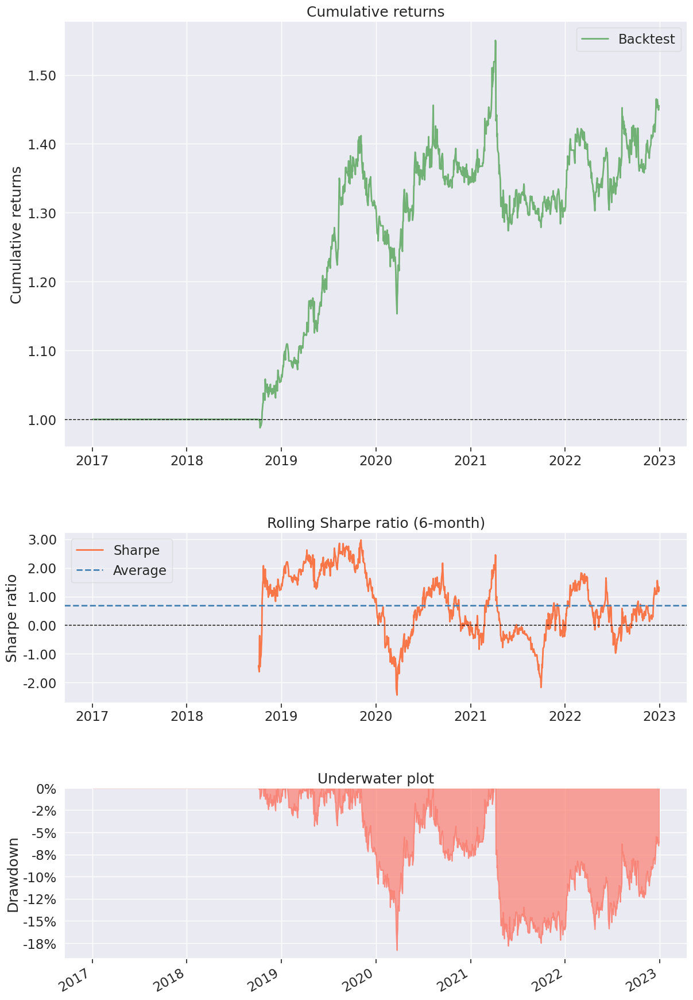

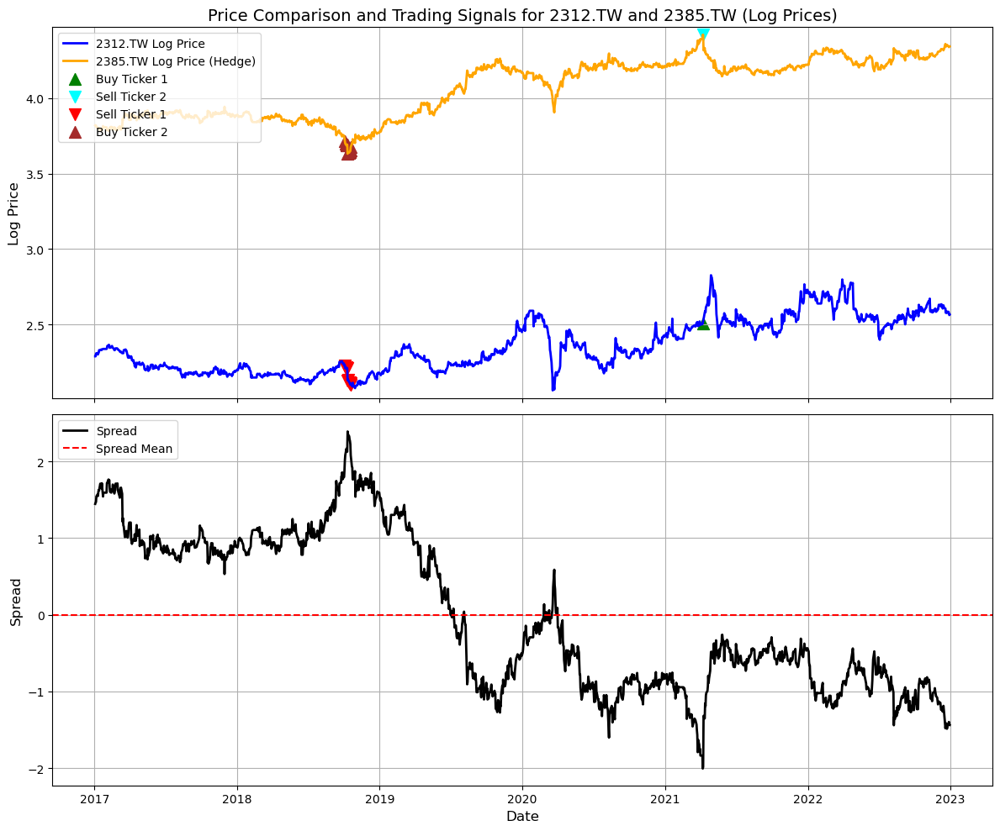

Results saved for 2312.TW and 2385.TW to 2312.TW_2385.TW_results.csv


,8163.TW,Spread,Signal,Volatility Mutiplier,K,2360.TW,8163.TW's trade,2360.TW's trade,8163.TW's position,2360.TW's position,Cash,Leverage,Number of trades,Status,Portfolio's Value
Date,,,,,,,,,,,,,,,
2017-01-03,12.991573,2.580524,Sell,NaN,1.2,60.787975,-8132.0,8132.0,-8132.0,8132.0,4.611320e+06,0.115130,1.0,Initiated,5.000000e+06
2017-01-04,13.114426,2.569782,Sell,NaN,1.2,61.107494,-6970.0,6970.0,-15102.0,15102.0,4.276808e+06,0.207662,2.0,Initiated,5.001599e+06
2017-01-05,13.237278,2.485581,Sell,NaN,1.0,62.305676,-4920.0,4920.0,-20022.0,20022.0,4.035391e+06,0.272629,3.0,Initiated,5.017839e+06
2017-01-06,12.838008,2.269163,Sell,NaN,1.0,64.302658,-4251.0,4251.0,-24273.0,24273.0,3.816615e+06,0.329130,4.0,Initiated,5.065817e+06
2017-01-09,12.530880,2.246358,Sell,NaN,1.0,64.063019,-3761.0,3761.0,-28034.0,28034.0,3.622803e+06,0.372135,5.0,Initiated,5.067455e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,33.647587,-1.044495,NaN,6.195898,0.0,168.750458,0.0,0.0,-53314.0,53314.0,2.118194e+06,5.094268,42.0,Initiated,9.321069e+06
2022-12-27,33.471420,-1.210997,NaN,6.235767,0.0,173.964661,0.0,0.0,-53314.0,53314.0,2.118194e+06,5.221073,42.0,Initiated,9.608451e+06
2022-12-28,33.163136,-1.113115,NaN,7.049006,0.0,170.172501,0.0,0.0,-53314.0,53314.0,2.118194e+06,5.117867,42.0,Initiated,9.422712e+06


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,10.938%
Cumulative returns,89.83%
Annual volatility,35.376%
Sharpe ratio,0.47
Calmar ratio,0.28
Stability,0.58
Max drawdown,-38.81%


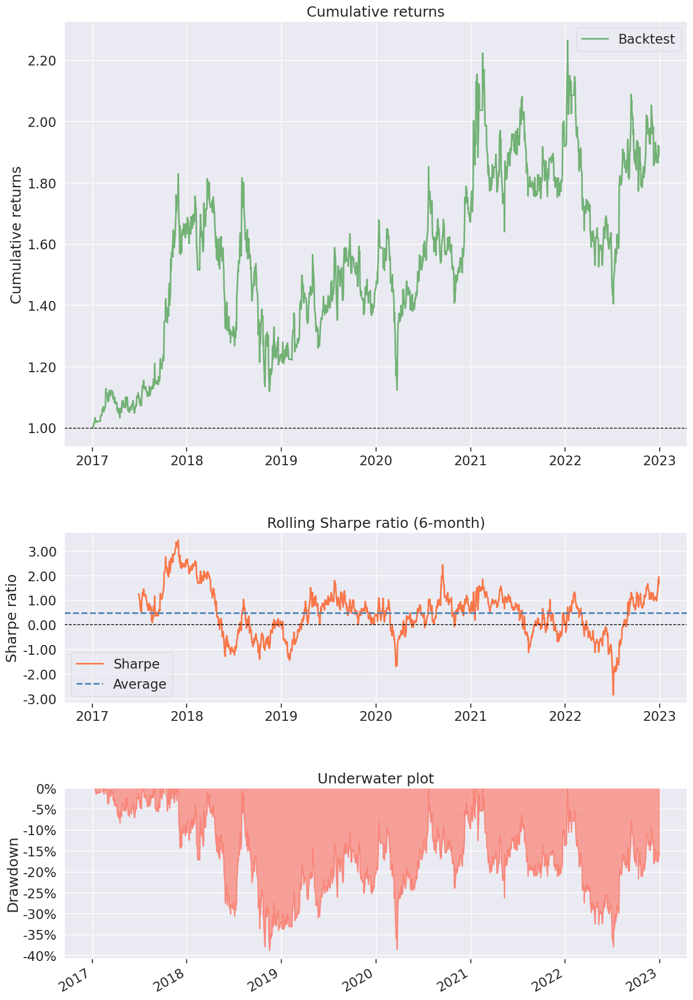

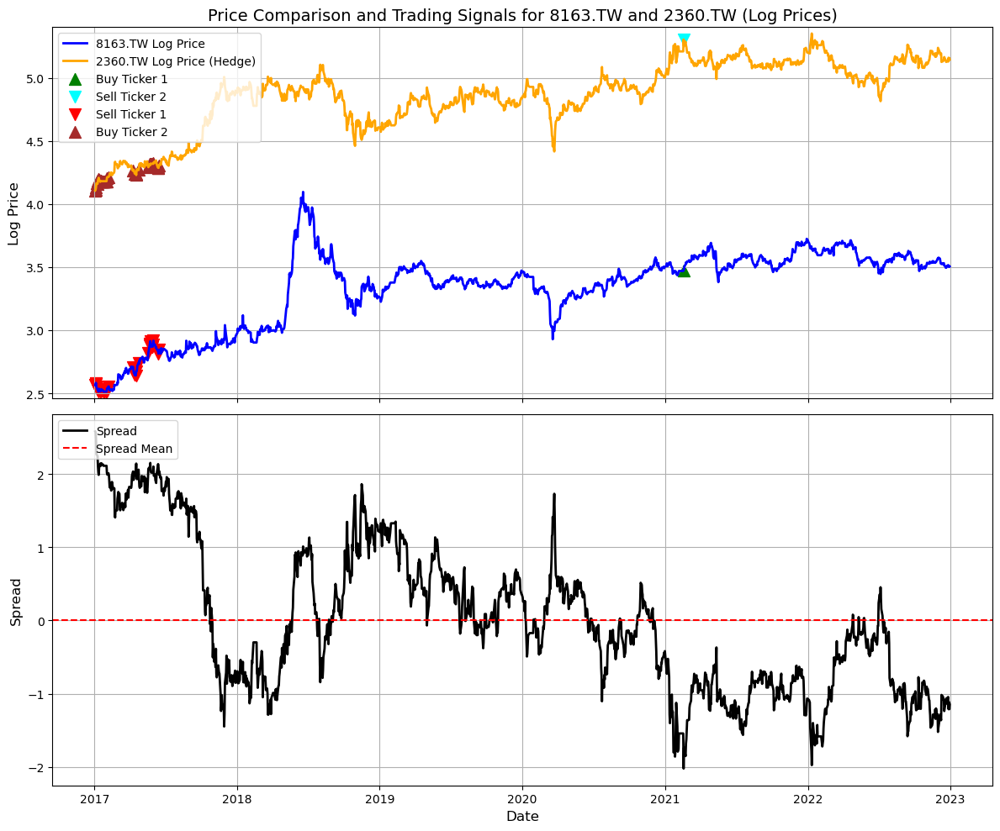

Results saved for 8163.TW and 2360.TW to 8163.TW_2360.TW_results.csv


,2337.TW,Spread,Signal,Volatility Mutiplier,K,2441.TW,2337.TW's trade,2441.TW's trade,2337.TW's position,2441.TW's position,Cash,Leverage,Number of trades,Status,Portfolio's Value
Date,,,,,,,,,,,,,,,
2017-01-03,6.662626,-3.357521,Buy,NaN,1.2,24.955187,18977.0,-18977.0,18977.0,-18977.0,5.347138e+06,0.100891,1.0,Initiated,5.000000e+06
2017-01-04,6.633657,-3.349712,Buy,NaN,1.2,24.826550,19251.0,-19251.0,38228.0,-38228.0,5.697369e+06,0.174298,2.0,Initiated,5.001891e+06
2017-01-05,6.879885,-3.236890,Buy,NaN,1.2,25.019508,19170.0,-19170.0,57398.0,-57398.0,6.045106e+06,0.232472,3.0,Initiated,5.003928e+06
2017-01-06,7.299920,-2.977318,Buy,NaN,1.2,24.955187,19084.0,-19084.0,76482.0,-76482.0,6.382039e+06,0.278782,4.0,Initiated,5.031729e+06
2017-01-09,7.415793,-2.988807,Buy,NaN,1.2,25.341091,18861.0,-18861.0,95343.0,-95343.0,6.720128e+06,0.317287,5.0,Initiated,5.011076e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,31.845282,0.369928,NaN,9.125830,0.0,43.448242,0.0,0.0,-60314.0,60314.0,8.533191e+06,1.000000,57.0,Initiated,9.233011e+06
2022-12-27,31.938396,0.423870,NaN,9.098657,0.0,43.088047,0.0,0.0,-60314.0,60314.0,8.533191e+06,1.000000,57.0,Initiated,9.205671e+06
2022-12-28,31.286592,0.428029,NaN,9.089864,0.0,42.322643,0.0,0.0,-60314.0,60314.0,8.533191e+06,1.000000,57.0,Initiated,9.198819e+06


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,10.466%
Cumulative returns,84.894%
Annual volatility,16.72%
Sharpe ratio,0.68
Calmar ratio,0.57
Stability,0.76
Max drawdown,-18.32%


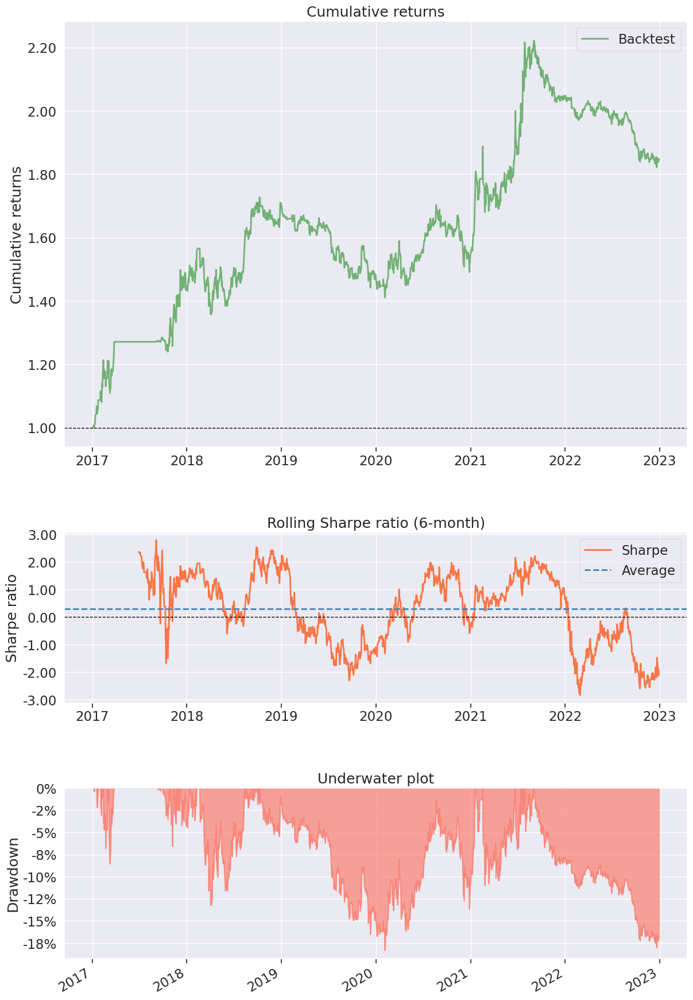

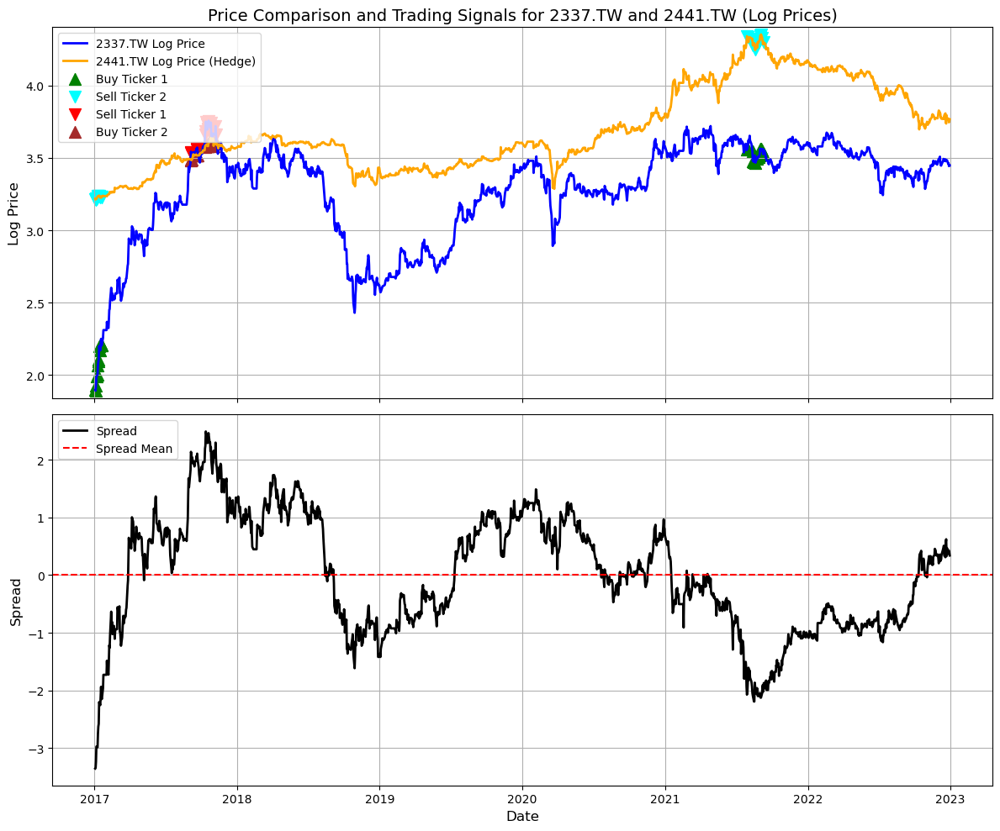

Results saved for 2337.TW and 2441.TW to 2337.TW_2441.TW_results.csv


,2337.TW,Spread,Signal,Volatility Mutiplier,K,2313.TW,2337.TW's trade,2313.TW's trade,2337.TW's position,2313.TW's position,Cash,Leverage,Number of trades,Status,Portfolio's Value
Date,,,,,,,,,,,,,,,
2017-01-03,6.662626,-2.868044,Buy,NaN,1.2,11.872495,32371.0,-32371.0,32371.0,-32371.0,5.168649e+06,0.104011,1.0,Initiated,5.000000e+06
2017-01-04,6.633657,-2.904693,Buy,NaN,1.2,11.910548,31505.0,-31505.0,63876.0,-63876.0,5.334897e+06,0.181692,2.0,Initiated,4.997830e+06
2017-01-05,6.879885,-2.749168,Buy,NaN,1.2,11.986654,30165.0,-30165.0,94041.0,-94041.0,5.488943e+06,0.244277,3.0,Initiated,5.008697e+06
2017-01-06,7.299920,-2.520851,Buy,NaN,1.2,12.176917,28353.0,-28353.0,122394.0,-122394.0,5.627220e+06,0.297569,4.0,Initiated,5.030305e+06
2017-01-09,7.415793,-2.455323,Buy,NaN,1.0,12.214970,22594.0,-22594.0,144988.0,-144988.0,5.735653e+06,0.331655,5.0,Initiated,5.039830e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,31.845282,-0.761049,NaN,6.039623,0.0,42.524921,0.0,0.0,-179737.0,179737.0,8.751728e+06,1.527364,57.0,Initiated,1.067125e+07
2022-12-27,31.938396,-0.775826,NaN,5.980609,0.0,42.801655,0.0,0.0,-179737.0,179737.0,8.751728e+06,1.534960,57.0,Initiated,1.070426e+07
2022-12-28,31.286592,-0.720310,NaN,5.909460,0.0,41.325733,0.0,0.0,-179737.0,179737.0,8.751728e+06,1.491262,57.0,Initiated,1.055613e+07


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,12.735%
Cumulative returns,109.626%
Annual volatility,27.449%
Sharpe ratio,0.57
Calmar ratio,0.35
Stability,0.66
Max drawdown,-36.088%


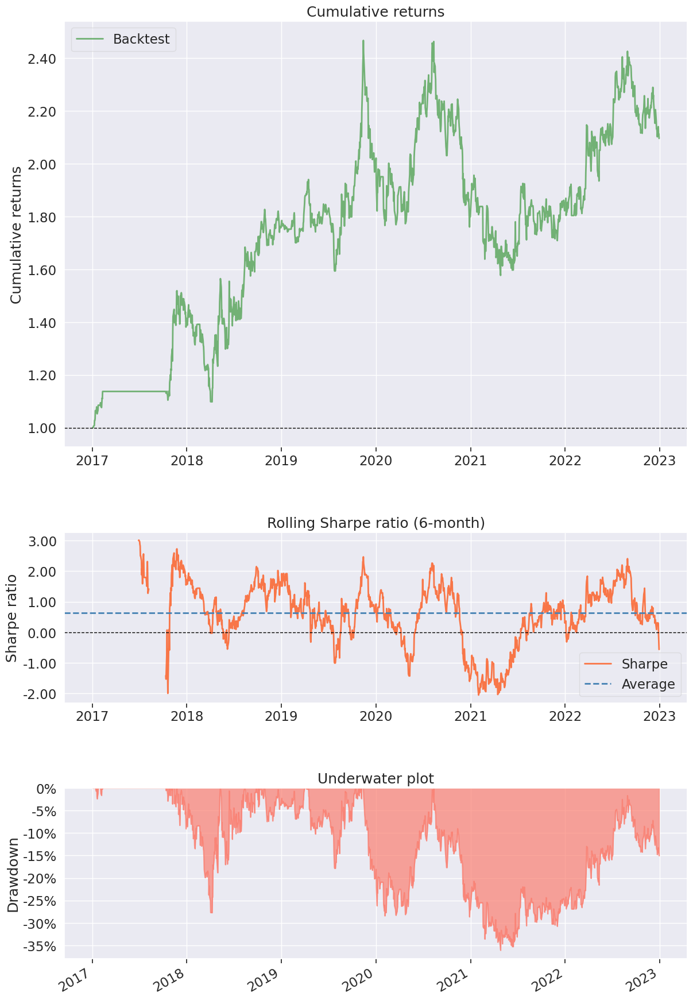

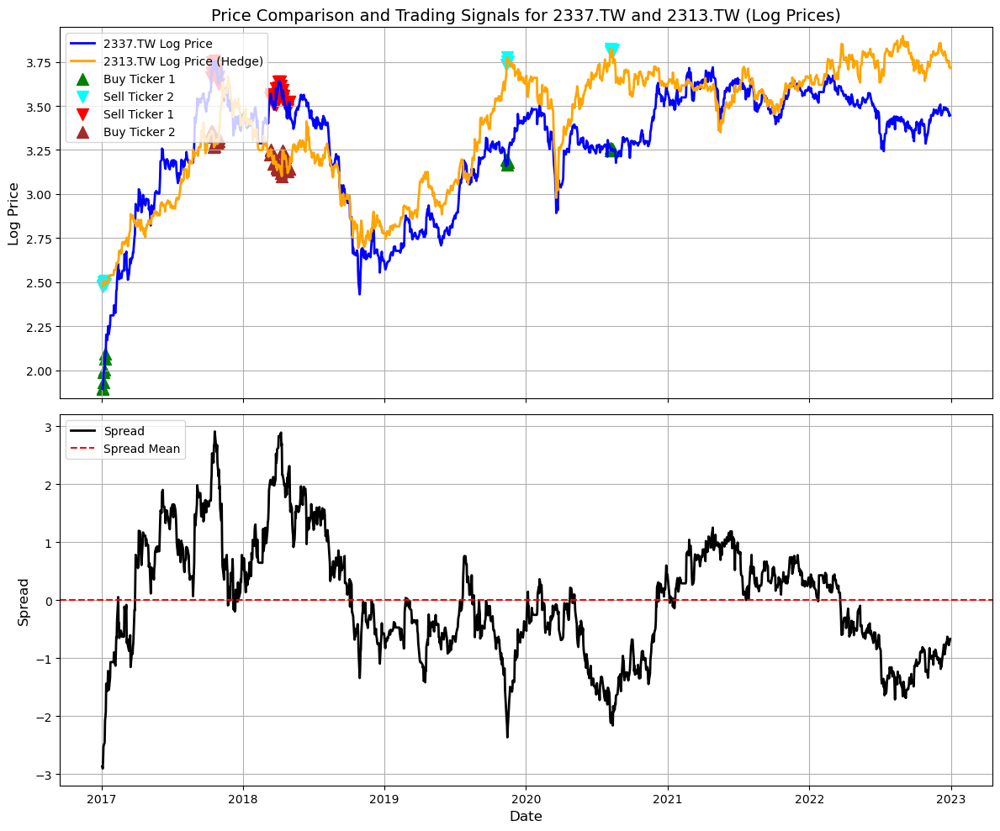

Results saved for 2337.TW and 2313.TW to 2337.TW_2313.TW_results.csv


,2337.TW,Spread,Signal,Volatility Mutiplier,K,2392.TW,2337.TW's trade,2392.TW's trade,2337.TW's position,2392.TW's position,Cash,Leverage,Number of trades,Status,Portfolio's Value
Date,,,,,,,,,,,,,,,
2017-01-03,6.662626,-4.843165,Buy,NaN,1.2,25.158493,18855.0,-18855.0,18855.0,-18855.0,5.348740e+06,0.100860,1.0,Initiated,5.000000e+06
2017-01-04,6.633657,-4.864764,Buy,NaN,1.2,25.226767,19016.0,-19016.0,37871.0,-37871.0,5.702306e+06,0.174642,2.0,Initiated,4.998167e+06
2017-01-05,6.879885,-4.736170,Buy,NaN,1.2,25.329176,18997.0,-18997.0,56868.0,-56868.0,6.052787e+06,0.232314,3.0,Initiated,5.003613e+06
2017-01-06,7.299920,-4.503704,Buy,NaN,1.2,25.192629,18972.0,-18972.0,75840.0,-75840.0,6.392248e+06,0.278241,4.0,Initiated,5.035265e+06
2017-01-09,7.415793,-4.442084,Buy,NaN,1.2,25.158493,19009.0,-19009.0,94849.0,-94849.0,6.729519e+06,0.314654,5.0,Initiated,5.046641e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,31.845282,0.407293,NaN,13.027757,0.0,34.372543,0.0,0.0,0.0,0.0,1.338337e+07,1.000000,67.0,Closed,1.338337e+07
2022-12-27,31.938396,0.407750,NaN,13.463688,0.0,34.557842,0.0,0.0,0.0,0.0,1.338337e+07,1.000000,67.0,Closed,1.338337e+07
2022-12-28,31.286592,0.364788,NaN,13.650805,0.0,33.955631,0.0,0.0,0.0,0.0,1.338337e+07,1.000000,67.0,Closed,1.338337e+07


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,17.287%
Cumulative returns,167.667%
Annual volatility,23.009%
Sharpe ratio,0.81
Calmar ratio,0.46
Stability,0.41
Max drawdown,-37.271%


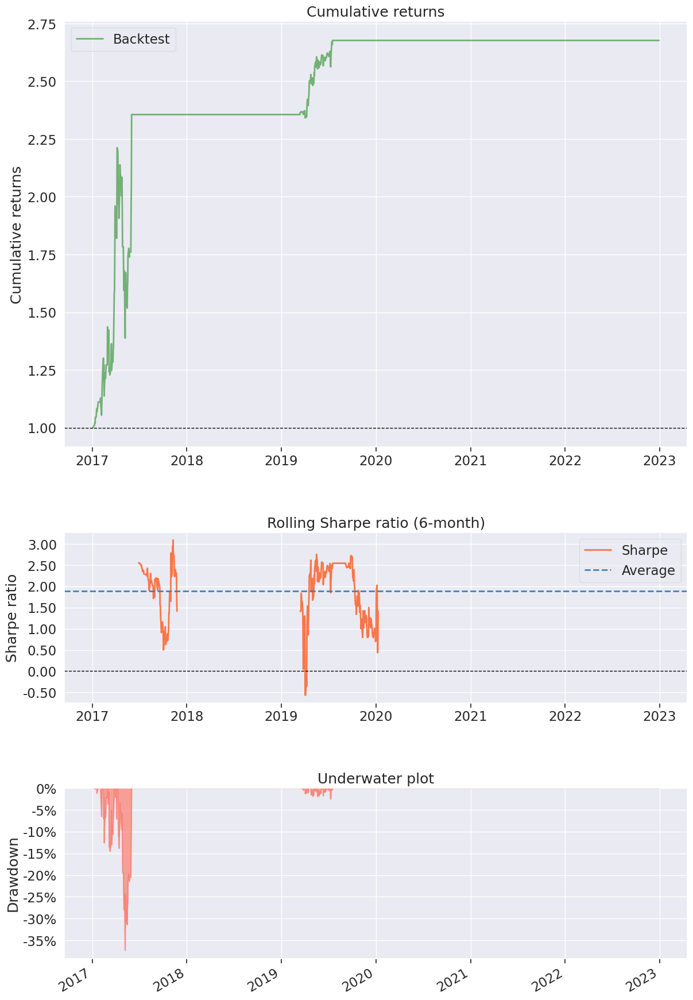

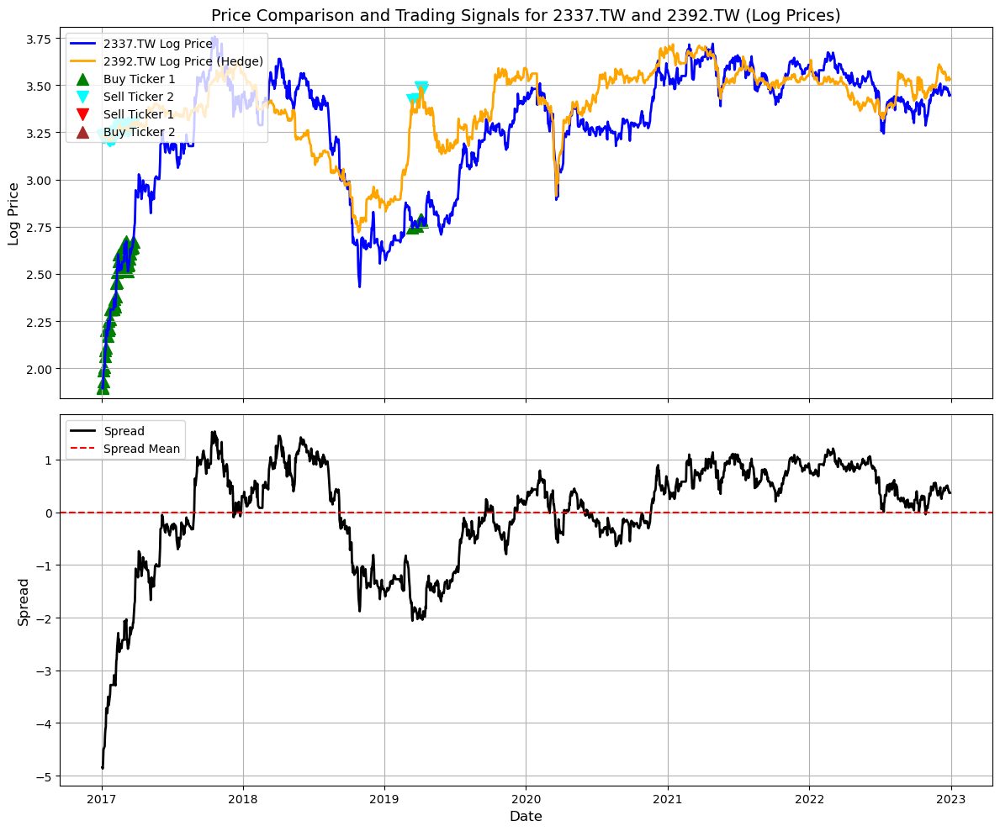

Results saved for 2337.TW and 2392.TW to 2337.TW_2392.TW_results.csv


,2337.TW,Spread,Signal,Volatility Mutiplier,K,3711.TW,2337.TW's trade,3711.TW's trade,2337.TW's position,3711.TW's position,Cash,Leverage,Number of trades,Status,Portfolio's Value
Date,,,,,,,,,,,,,,,
2017-01-03,6.662626,-3.565197,Buy,NaN,1.2,45.965416,11401.0,-11401.0,11401.0,-11401.0,5.448091e+06,0.099207,1.0,Initiated,5.000000e+06
2017-01-04,6.633657,-3.581734,Buy,NaN,1.2,45.965416,11745.0,-11745.0,23146.0,-23146.0,5.910043e+06,0.170811,2.0,Initiated,4.999670e+06
2017-01-05,6.879885,-3.518848,Buy,NaN,1.2,46.596039,11896.0,-11896.0,35042.0,-35042.0,6.382506e+06,0.226963,3.0,Initiated,4.990773e+06
2017-01-06,7.299920,-3.433678,Buy,NaN,1.2,47.787220,11862.0,-11862.0,46904.0,-46904.0,6.862766e+06,0.273518,4.0,Initiated,4.963750e+06
2017-01-09,7.415793,-3.390119,Buy,NaN,1.2,47.927361,12079.0,-12079.0,58983.0,-58983.0,7.352106e+06,0.307477,5.0,Initiated,4.962612e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,31.845282,-1.002474,NaN,7.273072,0.0,84.558746,0.0,0.0,0.0,0.0,7.722221e+06,1.000000,37.0,Closed,7.722221e+06
2022-12-27,31.938396,-1.020761,NaN,7.165547,0.0,85.008522,0.0,0.0,0.0,0.0,7.722221e+06,1.000000,37.0,Closed,7.722221e+06
2022-12-28,31.286592,-1.040123,NaN,7.081935,0.0,84.108963,0.0,0.0,0.0,0.0,7.722221e+06,1.000000,37.0,Closed,7.722221e+06


Start date,2017-01-03
End date,2022-12-30
Total months,74
,Backtest
Annual return,7.293%
Cumulative returns,54.444%
Annual volatility,21.089%
Sharpe ratio,0.44
Calmar ratio,0.29
Stability,0.12
Max drawdown,-25.374%


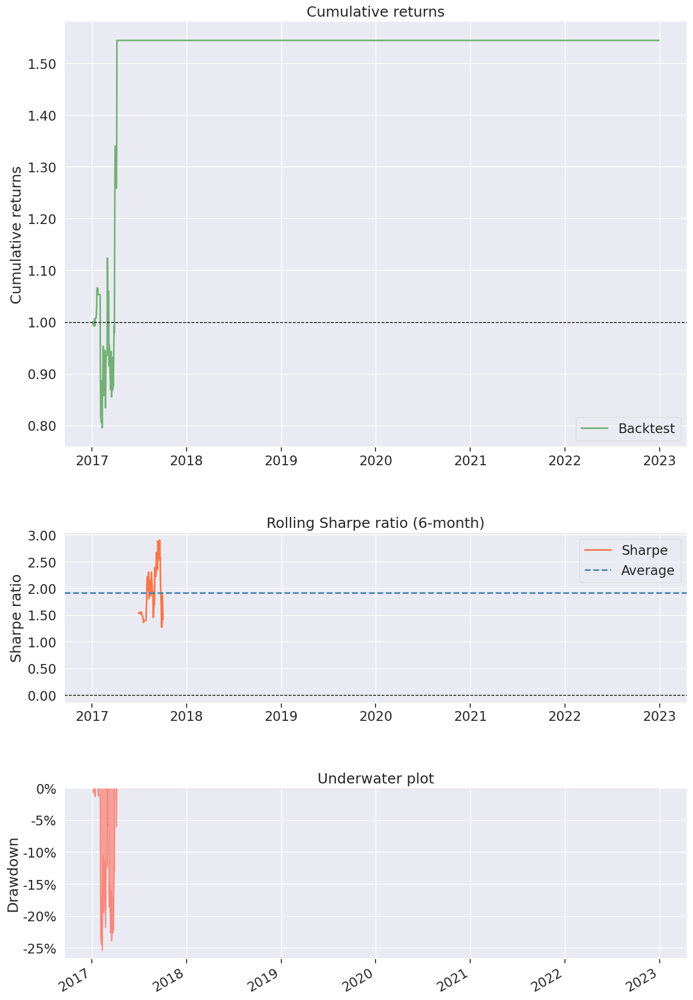

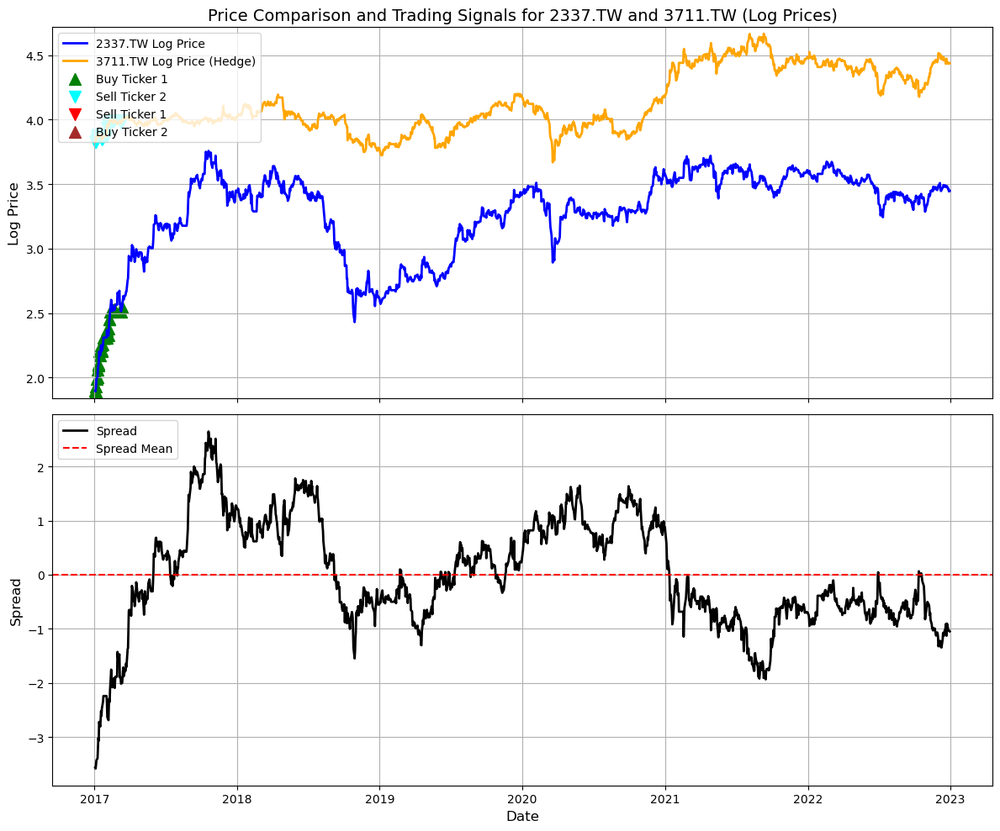

Results saved for 2337.TW and 3711.TW to 2337.TW_3711.TW_results.csv


In [118]:
import os 
for index, row in FPairs.iterrows():
    ticker1 = row[0] 
    ticker2 = row[1]
    Price_df = Strategy.position(ticker1,ticker2)
    display(Price_df)
    performance = Strategy.metric(Price_df) 
    Strategy.signal_plot(Price_df, HR)

    # Define the path and filename dynamically
    path = "C:\\Users\\User\\Desktop\\Analysis\\Personal Research"
    filename = f"{ticker1}_{ticker2}_results.csv"
    full_path = os.path.join(path, filename)
    
    # Save the portfolio DataFrame to CSV
    Price_df.to_csv(full_path, index=False)
    print(f"Results saved for {ticker1} and {ticker2} to {filename}")
